# Predicción de salarios de NBA

We will be working over two files. The first one contains players and corresponding stats. The second provides seasonal information about their salaries from 1985 to 2018. More details [here](https://www.kaggle.com/abdullahsahin/nba-salaries). Your goal is to build a model that predicts the NBA salaries. Feel free to work with only a subset of players, or attributes. 

#Librerías

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, ElasticNet, LassoLars
from sklearn import metrics
from sklearn import preprocessing
from sklearn.neighbors import KNeighborsRegressor, RadiusNeighborsRegressor
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
import statsmodels.api as sm
import math

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
!pip install pyCompare
from pyCompare import blandAltman

In [4]:
from google.colab import drive
#drive.mount('/content/gdrive')

#Análisis Exploratorio de los Datos

##Dataset de jugadores

In [5]:
players = pd.read_csv("https://raw.githubusercontent.com/emmanueliarussi/DataScienceCapstone/master/3_MidtermProjects/ProjectNBA/data/players.csv")
players

,_id,birthDate,birthPlace,career_AST,career_FG%,career_FG3%,career_FT%,career_G,career_PER,career_PTS,career_TRB,career_WS,career_eFG%,college,draft_pick,draft_round,draft_team,draft_year,height,highSchool,name,position,shoots,weight
0,abdelal01,"June 24, 1968","Cairo, Egypt",0.3,50.2,0.0,70.1,256,13.0,5.7,3.3,4.8,50.2,Duke University,25th overall,1st round,Portland Trail Blazers,1990,6-10,"Bloomfield in Bloomfield, New Jersey",Alaa Abdelnaby,Power Forward,Right,240lb
1,abdulza01,"April 7, 1946","Brooklyn, New York",1.2,42.8,NaN,72.8,505,15.1,9.0,8.0,17.5,NaN,Iowa State University,5th overall,1st round,Cincinnati Royals,1968,6-9,"John Jay in Brooklyn, New York",Zaid Abdul-Aziz,Power Forward and Center,Right,235lb
2,abdulka01,"April 16, 1947","New York, New York",3.6,55.9,5.6,72.1,1560,24.6,24.6,11.2,273.4,55.9,"University of California, Los Angeles",1st overall,1st round,Milwaukee Bucks,1969,7-2,"Power Memorial in New York, New York",Kareem Abdul-Jabbar,Center,Right,225lb
3,abdulma02,"March 9, 1969","Gulfport, Mississippi",3.5,44.2,35.4,90.5,586,15.4,14.6,1.9,25.2,47.2,Louisiana State University,3rd overall,1st round,Denver Nuggets,1990,6-1,"Gulfport in Gulfport, Mississippi",Mahmoud Abdul-Rauf,Point Guard,Right,162lb
4,abdulta01,"November 3, 1974","Maisons Alfort, France",1.1,41.7,23.7,70.3,236,11.4,7.8,3.3,3.5,42.2,"University of Michigan, San Jose State University",11th overall,1st round,Sacramento Kings,1997,6-6,"Lycee Aristide Briand in Evreux, France",Tariq Abdul-Wahad,Shooting Guard,Right,223lb
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4680,zizican01,"January 4, 1997","Split, Croatia",0.6,58.3,-,70.8,91,17.5,6.4,4.2,3.0,58.3,NaN,23rd overall,1st round,Boston Celtics,2016,6-11,NaN,Ante Zizic,Center,Right,254lb
4681,zoetji01,"December 20, 1953","Uxbridge, Canada",0.1,20.0,-,-,7,-0.8,0.3,1.1,-0.1,20.0,Kent State University,NaN,NaN,NaN,NaN,7-1,"Port Perry in Port Perry, Canada",Jim Zoet,Center,Right,240lb
4682,zopfbi01,"June 7, 1948",NaN,1.4,36.3,NaN,55.6,53,9.6,2.2,0.9,-0.1,NaN,Duquesne University,33rd overall,2nd round,Milwaukee Bucks,1970,6-1,"Monaca in Monaca, Pennsylvania",Bill Zopf,Point Guard,Right,170lb
4683,zubaciv01,"March 18, 1997","Mostar, Bosnia and Herzegovina",0.8,54.0,0.0,76.1,140,17.6,6.9,4.6,5.3,54.0,NaN,32nd overall,2nd round,Los Angeles Lakers,2016,7-1,NaN,Ivica Zubac,Center,Right,240lb


###Cantidad de jugadores

In [6]:
players_list = players['_id'].unique()
print('Hay %d jugadores en el dataset' % len(players_list))

Hay 4685 jugadores en el dataset


###Fecha de Nacimiento

In [7]:
#Jugadores sin fecha de nacimiento reportada. 

players['birthYear'] = ''
no_date = []
for i in range(len(players)):
  if(pd.isna(players['birthDate'][i])):
    print(players['name'][i], players['birthDate'][i])
    no_date.append(players['name'][i])

Bill Allen nan
Don Bielke nan
Clarence Brookins nan
Walter Byrd nan
Mack Daughtry nan
Rich Dumas nan
Gene Gillette nan
Darrell Hardy nan
Wilber Kirkland nan
Dick Lee nan
R.B. Lynam nan
Ken McBride nan
Howie McCarty nan
Larry Moore nan
Richard Moore nan
Mike O'Neill nan
Errol Palmer nan
Charles Parks nan
Frank Reddout nan
Bob Schafer nan
Pete Smith nan
Bruce Spraggins nan
Randy Stoll nan
Willis Thomas nan
Gary Turner nan
Dexter Westbrook nan
Bobby Wilson nan
Jim Wilson nan


In [8]:
#Incorporamos las fechas de nacimiento faltantes
add_year = [1945, 1932, 1946, 1942, 1947,1944, 1919,1944, 1947, np.nan, 1944, 1929,1919, 1942, 1945, 1928, 1945,1946, 1931,  1933, 1947,1940,1945, 1937,1945, 1943, 1951, 1921 ]

In [9]:
birth_dict = dict(zip(no_date, add_year))
birth_dict

{'Bill Allen': 1945,
 'Bob Schafer': 1933,
 'Bobby Wilson': 1951,
 'Bruce Spraggins': 1940,
 'Charles Parks': 1946,
 'Clarence Brookins': 1946,
 'Darrell Hardy': 1944,
 'Dexter Westbrook': 1943,
 'Dick Lee': nan,
 'Don Bielke': 1932,
 'Errol Palmer': 1945,
 'Frank Reddout': 1931,
 'Gary Turner': 1945,
 'Gene Gillette': 1919,
 'Howie McCarty': 1919,
 'Jim Wilson': 1921,
 'Ken McBride': 1929,
 'Larry Moore': 1942,
 'Mack Daughtry': 1947,
 "Mike O'Neill": 1928,
 'Pete Smith': 1947,
 'R.B. Lynam': 1944,
 'Randy Stoll': 1945,
 'Rich Dumas': 1944,
 'Richard Moore': 1945,
 'Walter Byrd': 1942,
 'Wilber Kirkland': 1947,
 'Willis Thomas': 1937}

In [10]:
players['birthYear'] = ''
no_date = []
for i in range(len(players)):
  try:
    players['birthYear'][i] = int(players['birthDate'][i][-4:])
  except:
    players['birthYear'][i] = birth_dict[players['name'][i]]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


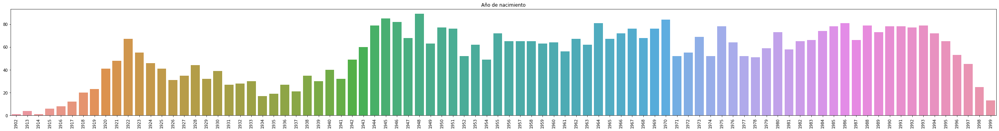

In [11]:
subset = players['birthYear'].value_counts()

plt.figure(figsize=(45,5))
plt.title('Año de nacimiento')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*Buscamos las fechas de nacimiento que faltaban en Internet, ya que no eran demasiados los casos faltantes y consideramos que la edad del jugador en cada temporada puede ser un atributo importante para la predicción*

### Lugar de Nacimiento

In [12]:
players['birthPlace'].value_counts()

Chicago, Illinois             137
Philadelphia, Pennsylvania    112
Los Angeles, California       107
Brooklyn, New York             90
New York, New York             87
                             ... 
Ethel, Mississippi              1
St. Louis Park, Minnesota       1
Griggsville, Illinois           1
Shellman, Georgia               1
Vero Beach, Florida             1
Name: birthPlace, Length: 1632, dtype: int64

In [13]:
#Estados y territorios de los Estados Unidos
USA_territory = ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina','North Dakota', 'Ohio','Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming']
USA_territory.append('U.S. VirgIslands')
USA_territory.append('District of Columbia')

In [14]:
#Distinción entre jugadores nacidos en los Estados Unidos, en otros países o cuyo lugar de origen no se encuentra reportado

other_places =[]
n_players_USA = 0
players['country']=''

for i in range (len(players)):
  if(players['birthPlace'][i] is not np.nan):
    state = players['birthPlace'][i][players['birthPlace'][i].find(',')+1:]
    if(state[0]==' '):  
      state = state[1:]
    if(state in USA_territory):
      #print(state)
      n_players_USA +=1
      players['country'][i] ='USA'
    else:
      #print('----------------------', players['birthPlace'][i], [state])
      other_places.append(state)
      players['country'][i] ='others'
  else:
    players['country'][i] = np.nan

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[3735, 450]


Text(0.5, 1.0, 'País de origen')

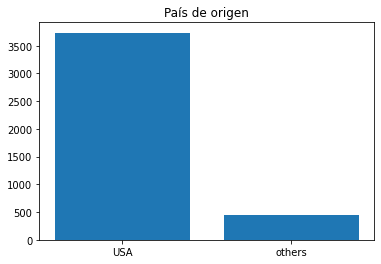

In [15]:
items = players['country'].value_counts().index
values = [players['country'].value_counts()[x] for x in items]
print(values)
plt.bar(items, values)
plt.title('País de origen')

In [16]:
print('Hay %d jugadores nacidos en Estados Unidos, %d jugadores nacidos en otros países y %d jugadores para los cuales no tenemos este dato' %(players['country'].to_list().count('USA'), players['country'].to_list().count('others'), len(players)-players['country'].to_list().count('USA')-players['country'].to_list().count('others')))

Hay 3735 jugadores nacidos en Estados Unidos, 450 jugadores nacidos en otros países y 500 jugadores para los cuales no tenemos este dato


In [17]:
freq = {}
frequency = {}
for item in other_places:
   if (item in frequency):
      frequency[item] += 1
   else:
      frequency[item] = 1
      
sorted_freq = dict(sorted(frequency.items(), key=lambda item: item[1]))
sorted_freq

{'Argentina': 12,
 'Australia': 21,
 'Austria': 1,
 'Bahamas': 5,
 'Belgium': 3,
 'Bosnia and Herzegovina': 13,
 'Brazil': 16,
 'Bulgaria': 1,
 'Cameroon': 4,
 'Canada': 33,
 'Cape Verde': 1,
 'China': 7,
 'Croatia': 17,
 'Cuba': 3,
 'Czech Republic': 4,
 'Democratic Republic of the Congo': 5,
 'Denmark': 1,
 'Dominica': 1,
 'Dominican Republic': 7,
 'Egypt': 2,
 'Estonia': 1,
 'FYR Macedonia': 2,
 'Finland': 2,
 'France': 22,
 'French Guiana': 2,
 'Gabon': 1,
 'Germany': 25,
 'Ghana': 1,
 'Greece': 9,
 'Guadeloupe': 3,
 'Guyana': 2,
 'Haiti': 4,
 'Hungary': 1,
 'Iceland': 1,
 'Ireland': 1,
 'Islamic Republic of Iran': 1,
 'Israel': 3,
 'Italy': 8,
 'Jamaica': 7,
 'Japan': 2,
 'Latvia': 6,
 'Lebanon': 2,
 'Lithuania': 11,
 'Luxembourg': 1,
 'Mali': 2,
 'Martinique': 1,
 'Mexico': 4,
 'Montenegro': 6,
 'Morocco': 1,
 'Netherlands': 6,
 'New Zealand': 4,
 'Nigeria': 10,
 'Norway': 1,
 'Panama': 4,
 'Poland': 4,
 'Puerto Rico': 8,
 'Republic of Korea': 1,
 'Republic of the Congo': 1,
 'Ro

<BarContainer object of 80 artists>

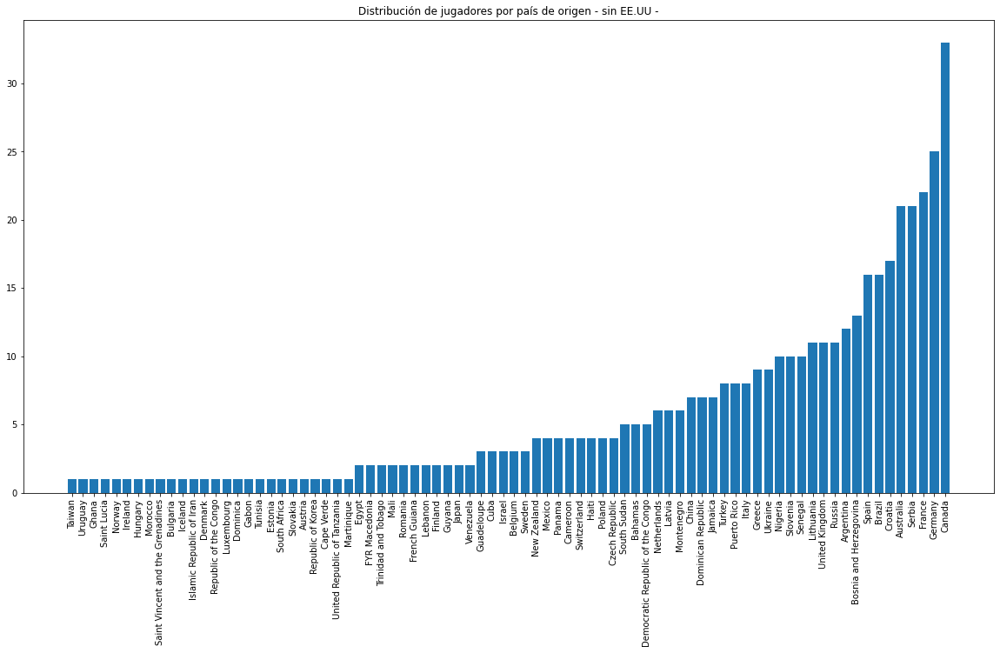

In [18]:
fig, ax = plt.subplots(figsize=(20,10))
items = sorted_freq.keys()
idx = [list(sorted_freq).index(x) for x in items]
values = sorted_freq.values()
plt.xticks(idx, items, rotation='vertical')
plt.title('Distribución de jugadores por país de origen - sin EE.UU -')
plt.bar(items,values) 

*Podemos notar que casi el 75% de los jugadores de la NBA son estadounidenses, mientras que no tenemos información para el 15% de los jugadores y el otro 10% corresponde a jugadores de otros países. Respecto a estos últimos, la mayoría provienen de Canadá, Alemania, Francia, Serbia, Australia, Croacia, Brasil y España*

###Carrera Profesional

*   AST : asistencias
*   FG% : porcentaje de tiros 
*   FG3% : porcentaje de tiros de tres puntos
*   FT : tiros libres
*   G : juegos
*   PER : tasa de eficiencia del jugador
*   PTS : puntos
*   TRB : rebotes totales
*   WS : acciones ganadas
*   eFG% : porcentaje de gol de campo efectivo

 

In [19]:
career_AST = [float(x) if x!='-' else np.nan for x in players['career_AST']]
career_FG = [float(x) if x!='-' else np.nan for x in players['career_FG%']]
career_FG3 = [float(x) if x!='-' else np.nan for x in players['career_FG3%']]
career_FT = [float(x) if x!='-' else np.nan for x in players['career_FT%']]
career_G = [float(x) if x!='-' else np.nan for x in players['career_G']]
career_PER = [float(x) if x!='-' else np.nan for x in players['career_PER']]
career_PTS = [float(x) if x!='-' else np.nan for x in players['career_PTS']]
career_TRB = [float(x) if x!='-' else np.nan for x in players['career_TRB']]
career_WS = [float(x) if x!='-' else np.nan for x in players['career_WS']]
career_eFG = [float(x) if x!='-' else np.nan for x in players['career_eFG%']]


In [20]:
players['career_AST'] = career_AST
players['career_FG%'] = career_FG
players['career_FG3%'] = career_FG3
players['career_FT%'] = career_FT
players['career_G'] = career_G
players['career_PER'] = career_PER
players['career_PTS'] = career_PTS
players['career_TRB'] = career_TRB
players['career_WS'] = career_WS
players['career_eFG%'] = career_eFG

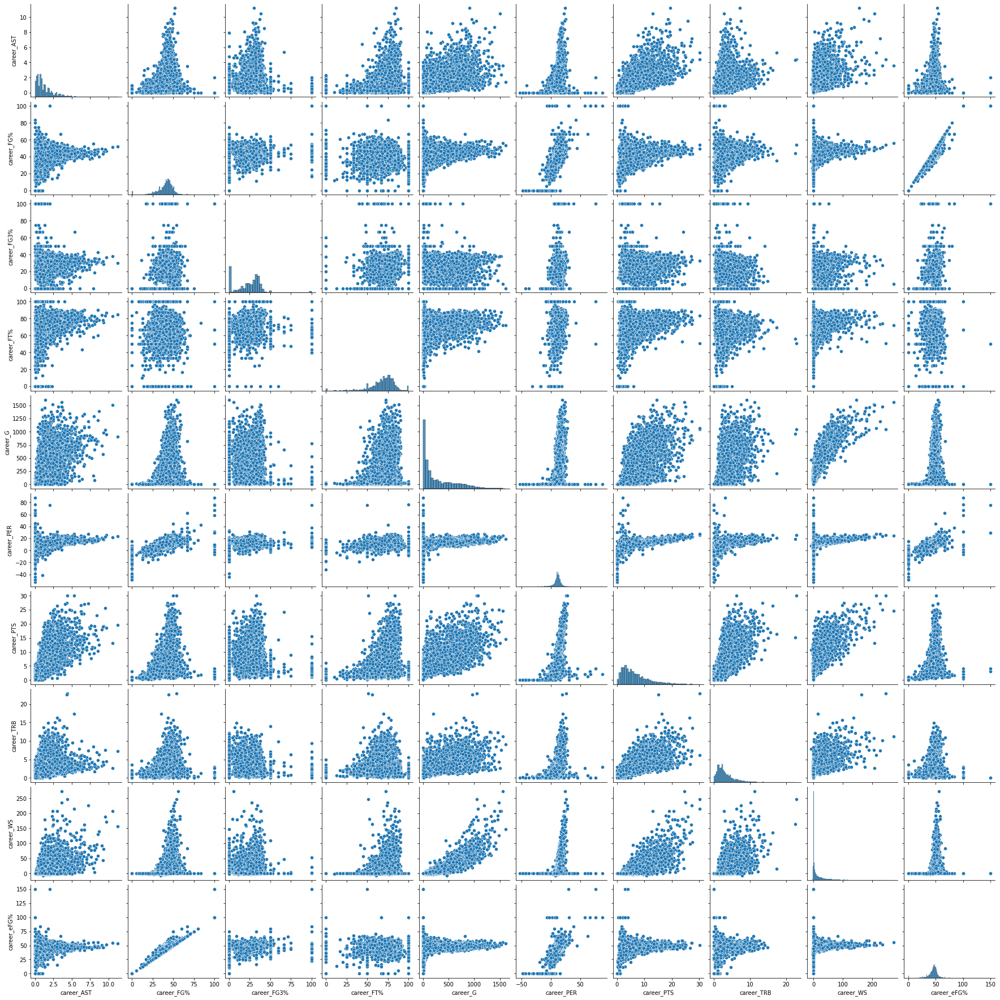

In [21]:
subset_career = players[['career_AST', 'career_FG%','career_FG3%', 'career_FT%', 'career_G', 'career_PER', 'career_PTS', 'career_TRB', 'career_WS', 'career_eFG%']]
sns.pairplot(subset_career)

###Universidad

In [22]:
college = players['college']

freq = {}
frequency = {}
for item in college:
   if (item in frequency):
      frequency[item] += 1
   else:
      frequency[item] = 1
for key, value in frequency.items():
   print("% s -> % d" % (key, value)) 

sorted_freq = dict(sorted(frequency.items(), key=lambda item: item[1]))

Duke University ->  75
Iowa State University ->  22
University of California, Los Angeles ->  90
Louisiana State University ->  41
University of Michigan, San Jose State University ->  1
University of California ->  31
Indiana University ->  60
Western Kentucky University ->  31
Salem International University ->  1
nan ->  313
Pepperdine University ->  17
Long Island University ->  22
Oral Roberts University ->  6
Hillsdale College ->  1
Baylor University ->  15
University of Oklahoma ->  18
Northwestern University ->  15
Gardner-Webb University ->  3
University of Arizona ->  48
St. Bonaventure University ->  17
Boston College ->  22
University of Pittsburgh ->  19
Syracuse University ->  45
University of Kentucky ->  102
University of Louisville ->  55
Loyola Marymount University ->  5
University of Connecticut ->  36
Michigan State University ->  48
DePaul University ->  34
Missouri State University ->  4
Brigham Young University ->  21
Morehead State University ->  5
Washington Sta

In [23]:
college_freq = np.asarray(list(sorted_freq.values()))
p90 = np.percentile(college_freq, 90)
p90

18.0

In [24]:
high_college = []
low_college = []

for key, value in sorted_freq.items():
  if(value>=18):
    if(key not in high_college):
      high_college.append(key)

  else:
     if(key not in low_college):
      low_college.append(key)

In [25]:
for i in range(len(players)):
  if(players['college'][i] in high_college):
    players['college'][i] = 'high'

  elif(players['college'][i] in low_college):
    players['college'][i] = 'low'

  else:
    print(players['college'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [26]:
players['college'].value_counts()

high    2924
low     1761
Name: college, dtype: int64

In [27]:
n_low = 0
n_high = 0

for i,v in enumerate(college_freq):
  if(v<18):
    n_low +=1
  else:
    n_high +=1

print('Hay %d universidades muy elegidas (más de 18 jugadores provienen de ellas) y hay %d universidades poco elegidas (con menos de 18 jugadores en la NBA)' %(n_high, n_low))

Hay 78 universidades muy elegidas (más de 18 jugadores provienen de ellas) y hay 654 universidades poco elegidas (con menos de 18 jugadores en la NBA)


###Colegio

In [28]:
highSchool = players['highSchool']

freq = {}
frequency = {}
for item in highSchool:
   if (item in frequency):
      frequency[item] += 1
   else:
      frequency[item] = 1
for key, value in frequency.items():
   print("% s -> % d" % (key, value)) 

sorted_freq = dict(sorted(frequency.items(), key=lambda item: item[1]))

Bloomfield in Bloomfield, New Jersey ->  3
John Jay in Brooklyn, New York ->  1
Power Memorial in New York, New York ->  5
Gulfport in Gulfport, Mississippi ->  1
Lycee Aristide Briand in Evreux, France ->  1
Wheeler in Marietta, Georgia ->  4
Saint Joseph in South Bend, Indiana ->  2
Fairdale in Louisville, Kentucky ->  1
Etna in Etna, Pennsylvania ->  1
nan ->  660
Eisenhower in Rialto, California ->  1
Metropolitan in New York, New York ->  2
Palos Verdes in Palos Verdes Estates, California ->  1
Troy in Troy, Michigan ->  1
Mesquite Horn in Mesquite, Texas ->  1
Putnam City in Warr Acres, Oklahoma ->  1
South Fulton in South Fulton, Georgia ->  1
Westchester in Los Angeles, California ->  6
Mount St. Joseph in Baltimore, Maryland ->  1
Oak Hill Academy in Mouth of Wilson, Virginia ->  29
Hartford Public in Hartford, Connecticut ->  3
Notre Dame Preparatory School in Fitchburg, Massachusetts ->  6
Snyder in Jersey City, New Jersey ->  2
High Point Christian Academy in High Point, No

In [29]:
school_freq = np.asarray(list(sorted_freq.values()))
p90 = np.percentile(school_freq, 90)
p90

2.0

In [30]:
high_hs = []
low_hs = []

for key, value in sorted_freq.items():
  if(value>=2):
    if(key not in high_hs):
      high_hs.append(key)

  else:
     if(key not in low_hs):
      low_hs.append(key)

In [31]:
for i in range(len(players)):
  if(players['highSchool'][i] in high_hs):
    players['highSchool'][i] = 'high'

  elif(players['highSchool'][i] in low_hs):
    players['highSchool'][i] = 'low'

  else:
    print(players['highSchool'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [32]:
players['highSchool'].value_counts()

high    2648
low     2037
Name: highSchool, dtype: int64

In [33]:
n_low = 0
n_high = 0

for i,v in enumerate(school_freq):
  if(v<18):
    n_low +=1
  else:
    n_high +=1

print('Hay %d colegios muy elegidos (más de 18 jugadores provienen de ellos) y hay %d colegios poco elegidos (con menos de 18 jugadores en la NBA)' %(n_high, n_low))

Hay 2 colegios muy elegidos (más de 18 jugadores provienen de ellos) y hay 2707 colegios poco elegidos (con menos de 18 jugadores en la NBA)


###Draft 

*   pick : posición en el que fue seleccionado en el Draft de ese año
*   round : ronda en la que fue seleccionado en el Draft de ese año
*   team : equipo que lo eligió en el Draft
*   year : año del Draft


####Selección

In [34]:
players['draft_pick'].value_counts()

5th overall      72
2nd overall      70
3rd overall      69
6th overall      69
1st overall      69
                 ..
142nd overall     1
153rd overall     1
215th overall     1
202nd overall     1
211th overall     1
Name: draft_pick, Length: 195, dtype: int64

In [35]:
#Homogeneizamos los valores de este atributo, reemplazando las cadenas de caracteres para que queden sólo valores numéricos

pick = players['draft_pick']
players['draft_pick'] = [(x.replace(' overall','').replace('st','').replace('nd', '').replace('rd','').replace('th','')) if isinstance(x,str) else np.nan for x in pick]
players['draft_pick'].value_counts()

5      72
2      70
3      69
1      69
6      69
       ..
211     1
214     1
145     1
129     1
135     1
Name: draft_pick, Length: 195, dtype: int64

In [36]:
#Exploramos valores que no corresponden a esta columna

for i in range(len(players)):
  try:
    players['draft_pick'][i] = int(players['draft_pick'][i])
  except:
    if not(pd.isna(players['draft_pick'][i])):
     print(players['draft_pick'][i],'|', players['draft_round'][i], '|', players['draft_team'][i], '|',players['draft_year'][i])

1953 NBA Draft | 2nd roun | New York Knicks | nan
1949 BAA Draft | 5th roun | Washington Capitols | nan
1949 BAA Draft | 2nd roun | Indianapolis Olympians | nan
a Minneapolis Lakers | 1956 NBA Draf | Minneapolis Lakers | 1st 
1950 NBA Draft | 5th roun | Minneapolis Lakers | nan
1949 BAA Draft | 2nd roun | Chicago Stags | nan
1950 NBA Draft | 7th roun | Indianapolis Olympians | nan
1949 BAA Draft | 3rd roun | Philadelphia Warriors | nan
1950 NBA Draft | 5th roun | Philadelphia Warriors | nan
1949 BAA Draft | 6th roun | Indianapolis Olympians | nan
a Philadelphia Warriors | 1952 NBA Draf | Philadelphia Warriors | 8th 
1950 NBA Draft | 3rd roun | Fort Wayne Pistons | nan
1950 NBA Draft | 2nd roun | Syracuse Nationals | nan


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


1950 NBA Draft | 5th roun | Tri-Cities Blackhawks | nan
a Rocheer Royals | 1948 BAA Draf | Providence Steamrollers | 2nd 
1952 NBA Draft | 10th roun | Boston Celtics | nan
1950 NBA Draft | 2nd roun | Boston Celtics | nan
1949 BAA Draft | 5th roun | Providence Steamrollers | nan
1950 NBA Draft | 2nd roun | Philadelphia Warriors | nan
1952 NBA Draft | 2nd roun | Philadelphia Warriors | nan
1950 NBA Draft | 9th roun | Tri-Cities Blackhawks | nan
1950 NBA Draft | 3rd roun | Baltimore Bullets | nan
1949 BAA Draft | 5th roun | St. Louis Bombers | nan
1950 NBA Draft | 3rd roun | Boston Celtics | nan
1949 BAA Draft | 2nd roun | New York Knicks | nan
1949 BAA Draft | 3rd roun | Chicago Stags | nan
1949 BAA Draft | 4th roun | Indianapolis Olympians | nan
a New York Knicks | 1947 BAA Draf | Baltimore Bullets | 1948
1950 NBA Draft | 2nd roun | Tri-Cities Blackhawks | nan
1949 BAA Draft | 3rd roun | Baltimore Bullets | nan
1950 NBA Draft | 4th roun | Minneapolis Lakers | nan
1953 NBA Draft | 3rd ro

In [37]:
#Los valores que no corresponden a draft_pick y describen año del Draft son trasladados a la columna correspondiente siempre y cuando el año del Draft esté vacío

for i in range(len(players)):
  try:
    players['draft_pick'][i] = int(players['draft_pick'][i])
  except:
    if (not(pd.isna(players['draft_pick'][i])) and ('Draft' in players['draft_pick'][i]) and pd.isna(players['draft_year'][i])):
      print(players['draft_pick'][i],'|', players['draft_round'][i], '|', players['draft_team'][i], '|',players['draft_year'][i])

      players['draft_year'][i] = int(players['draft_pick'][i][:4])
      players['draft_pick'][i] = np.nan
      print(players['draft_pick'][i],'|', players['draft_round'][i], '|', players['draft_team'][i], '|',players['draft_year'][i])
      print('\n')

1953 NBA Draft | 2nd roun | New York Knicks | nan
nan | 2nd roun | New York Knicks | 1953


1949 BAA Draft | 5th roun | Washington Capitols | nan
nan | 5th roun | Washington Capitols | 1949


1949 BAA Draft | 2nd roun | Indianapolis Olympians | nan
nan | 2nd roun | Indianapolis Olympians | 1949


1950 NBA Draft | 5th roun | Minneapolis Lakers | nan
nan | 5th roun | Minneapolis Lakers | 1950


1949 BAA Draft | 2nd roun | Chicago Stags | nan
nan | 2nd roun | Chicago Stags | 1949


1950 NBA Draft | 7th roun | Indianapolis Olympians | nan
nan | 7th roun | Indianapolis Olympians | 1950


1949 BAA Draft | 3rd roun | Philadelphia Warriors | nan
nan | 3rd roun | Philadelphia Warriors | 1949


1950 NBA Draft | 5th roun | Philadelphia Warriors | nan
nan | 5th roun | Philadelphia Warriors | 1950


1949 BAA Draft | 6th roun | Indianapolis Olympians | nan
nan | 6th roun | Indianapolis Olympians | 1949




/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_pa

1950 NBA Draft | 3rd roun | Fort Wayne Pistons | nan
nan | 3rd roun | Fort Wayne Pistons | 1950


1950 NBA Draft | 2nd roun | Syracuse Nationals | nan
nan | 2nd roun | Syracuse Nationals | 1950


1950 NBA Draft | 5th roun | Tri-Cities Blackhawks | nan
nan | 5th roun | Tri-Cities Blackhawks | 1950


1952 NBA Draft | 10th roun | Boston Celtics | nan
nan | 10th roun | Boston Celtics | 1952


1950 NBA Draft | 2nd roun | Boston Celtics | nan
nan | 2nd roun | Boston Celtics | 1950


1949 BAA Draft | 5th roun | Providence Steamrollers | nan
nan | 5th roun | Providence Steamrollers | 1949


1950 NBA Draft | 2nd roun | Philadelphia Warriors | nan
nan | 2nd roun | Philadelphia Warriors | 1950


1952 NBA Draft | 2nd roun | Philadelphia Warriors | nan
nan | 2nd roun | Philadelphia Warriors | 1952


1950 NBA Draft | 9th roun | Tri-Cities Blackhawks | nan
nan | 9th roun | Tri-Cities Blackhawks | 1950


1950 NBA Draft | 3rd roun | Baltimore Bullets | nan
nan | 3rd roun | Baltimore Bullets | 1950


19

In [38]:
# Evaluamos los otros valores que no corresponden a esta columna

for i in range(len(players)):
  if not(isinstance(players['draft_pick'][i], float) or isinstance(players['draft_pick'][i], int)):
     print(players['name'][i],'--->', players['draft_pick'][i],'|', players['draft_round'][i], '|', players['draft_team'][i],'|', players['draft_year'][i] ) 

Elgin Baylor ---> a Minneapolis Lakers | 1956 NBA Draf | Minneapolis Lakers | 1st 
Tom Brennan ---> a Philadelphia Warriors | 1952 NBA Draf | Philadelphia Warriors | 8th 
Jack Coleman ---> a Rocheer Royals | 1948 BAA Draf | Providence Steamrollers | 2nd 
Harry Gallatin ---> a New York Knicks | 1947 BAA Draf | Baltimore Bullets | 1948
K.C. Jones ---> a Boon Celtics | 1955 NBA Draf | Minneapolis Lakers | 2nd 
Sam Jones ---> a Boon Celtics | 1956 NBA Draf | Minneapolis Lakers | 1st 
Johnny Orr ---> a St. Louis Bombers | 1948 BAA Draf | Minneapolis Lakers | 2nd 
Bob Peterson ---> a Baltimore Bullets | 1952 NBA Draf | Baltimore Bullets | 1953
Jim Pollard ---> a St. Louis Bombers | 1947 BAA Draf | Chicago Stags | 1947
Kenny Sears ---> a New York Knicks | 1953 NBA Draf | Rochester Royals | 1st 


In [39]:
#Trasladamos el valor de draft_pick a draft_team siempre que corresponda

for i in range(len(players)):
  if not(isinstance(players['draft_pick'][i], float) or isinstance(players['draft_pick'][i], int)):
    if(players['draft_pick'][i][2:] in players['draft_team'][i]):
      players['draft_pick'][i] = np.nan
    else:
      print(players['name'][i],'--->', players['draft_pick'][i],'|', players['draft_round'][i], '|', players['draft_team'][i],'|', players['draft_year'][i] ) 
      players['draft_pick'][i] =  np.nan

Jack Coleman ---> a Rocheer Royals | 1948 BAA Draf | Providence Steamrollers | 2nd 
Harry Gallatin ---> a New York Knicks | 1947 BAA Draf | Baltimore Bullets | 1948
K.C. Jones ---> a Boon Celtics | 1955 NBA Draf | Minneapolis Lakers | 2nd 
Sam Jones ---> a Boon Celtics | 1956 NBA Draf | Minneapolis Lakers | 1st 
Johnny Orr ---> a St. Louis Bombers | 1948 BAA Draf | Minneapolis Lakers | 2nd 
Jim Pollard ---> a St. Louis Bombers | 1947 BAA Draf | Chicago Stags | 1947
Kenny Sears ---> a New York Knicks | 1953 NBA Draf | Rochester Royals | 1st 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [40]:
#Verificamos que cada elemento en draft_pick sólo corresponda a un valor entero o se encuentren vacías (np.nan)

n=0
for i in range(len(players)):
  if (not isinstance(players['draft_pick'][i], int) and not pd.isna(players['draft_pick'][i])):
    print(players['draft_pick'][i])
    n+=1
if(n==0):
    print('Campo de draft_pick está constituido por enteros o nan values')

Campo de draft_pick está constituido por enteros o nan values


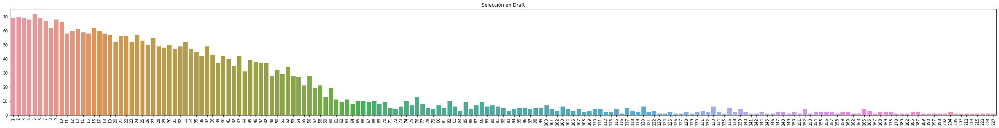

In [41]:
subset = players['draft_pick'].value_counts()

plt.figure(figsize=(45,5))
plt.title('Selección en Draft')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*La mayoría de los jugadores fueron seleccionados entre los 50 mejores de su año*

####Ronda

In [42]:
players['draft_round'].value_counts()

1st round                                             1433
2nd round                                             1034
3rd round                                              268
4th round                                              163
5th round                                               93
6th round                                               69
7th round                                               65
8th round                                               56
1948 BAA Draf                                           39
9th round                                               29
1947 BAA Draf                                           26
10th round                                              25
1952 NBA Draf                                           23
11th round                                              18
1956 NBA Draf                                           18
2nd roun                                                18
12th round                                              

In [43]:
#Detectamos que hay valores de draft_round que deberían encontrarse en draft_pick

for i in range(len(players)):
  dround = players['draft_round'][i]
  if not (pd.isna(dround)):
    if('overall' in dround):
      print(players['name'][i], '--->', players['draft_pick'][i], '|', players['draft_round'][i], '|', players['draft_team'][i], '|', players['draft_year'][i])

Phil Chenier ---> nan | 4th overall in the 1971 Supplemental Hardship Draf | Baltimore Bullets | nan
Tom Payne ---> nan | 2nd overall in the 1971 Supplemental Hardship Draf | Atlanta Hawks | nan
Nate Williams ---> nan | 1st overall in the 1971 Supplemental Hardship Draf | Cincinnati Royals | nan


In [44]:
#Trasladamos los valores de draft_round que deberían encontrarse en draft_pick a este último atributo

for i in range(len(players)):
  dround = players['draft_round'][i]
  if not (pd.isna(dround)):
    if('overall' in dround):
      print(players['name'][i], '--->', players['draft_pick'][i], '|', players['draft_round'][i], '|', players['draft_team'][i], '|', players['draft_year'][i])
      players['draft_pick'][i] = int(players['draft_round'][i][0:1])
      players['draft_round'][i] = np.nan
      print(players['draft_pick'][i])

Phil Chenier ---> nan | 4th overall in the 1971 Supplemental Hardship Draf | Baltimore Bullets | nan
4
Tom Payne ---> nan | 2nd overall in the 1971 Supplemental Hardship Draf | Atlanta Hawks | nan
2
Nate Williams ---> nan | 1st overall in the 1971 Supplemental Hardship Draf | Cincinnati Royals | nan
1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [45]:
#Detectamos que hay valores de draft_round que deberían encontrarse en draft_year

for i in range(len(players)):
  dround = players['draft_round'][i]
  if not (pd.isna(dround)):
    if('Draf' in dround):
      print(players['name'][i], '--->', players['draft_pick'][i], '|', players['draft_round'][i], '|', players['draft_team'][i], '|', players['draft_year'][i])
      

Forest Able ---> nan | 1956 NBA Draf | Syracuse Nationals | nan
Paul Arizin ---> nan | 1950 NBA Draft | Philadelphia Warriors | nan
Bob Armstrong ---> nan | 1955 NBA Draf | Rochester Royals | nan
Dick Atha ---> nan | 1953 NBA Draf | New York Knicks | nan
Johnny Bach ---> nan | 1948 BAA Draf | Boston Celtics | nan
John Barber ---> nan | 1956 NBA Draf | Minneapolis Lakers | nan
Elgin Baylor ---> nan | 1956 NBA Draf | Minneapolis Lakers | 1st 
Ernie Beck ---> nan | 1953 NBA Draft | Philadelphia Warriors | nan
Irv Bemoras ---> nan | 1953 NBA Draf | Milwaukee Hawks | nan
Gene Berce ---> nan | 1948 BAA Draf | New York Knicks | nan
Gary Bergen ---> nan | 1956 NBA Draf | New York Knicks | nan
Hank Biasatti ---> nan | 1947 BAA Draf | Boston Celtics | nan
Jerry Bird ---> nan | 1956 NBA Draf | Minneapolis Lakers | nan
Bill Bolger ---> nan | 1953 NBA Draf | Milwaukee Hawks | nan
Bill Bradley ---> nan | 1965 NBA Draft | New York Knicks | nan
Jim Brasco ---> nan | 1952 NBA Draf | Syracuse Nationals 

In [46]:
#Trasladamos los valores de draft_round que son años a draft_year

for i in range(len(players)):
  dround = players['draft_round'][i]
  if not (pd.isna(dround)):
    if('Draf' in dround and pd.isna(players['draft_year'][i])):
      players['draft_year'][i]=int(players['draft_round'][i][0:4])
      players['draft_round'][i] = np.nan

    if('Draf' in dround):
      print(players['name'][i], '--->', players['draft_pick'][i], '|', players['draft_round'][i], '|', players['draft_team'][i], '|', players['draft_year'][i])  
      

Forest Able ---> nan | nan | Syracuse Nationals | 1956
Paul Arizin ---> nan | nan | Philadelphia Warriors | 1950
Bob Armstrong ---> nan | nan | Rochester Royals | 1955
Dick Atha ---> nan | nan | New York Knicks | 1953
Johnny Bach ---> nan | nan | Boston Celtics | 1948
John Barber ---> nan | nan | Minneapolis Lakers | 1956
Elgin Baylor ---> nan | 1956 NBA Draf | Minneapolis Lakers | 1st 
Ernie Beck ---> nan | nan | Philadelphia Warriors | 1953
Irv Bemoras ---> nan | nan | Milwaukee Hawks | 1953
Gene Berce ---> nan | nan | New York Knicks | 1948
Gary Bergen ---> nan | nan | New York Knicks | 1956
Hank Biasatti ---> nan | nan | Boston Celtics | 1947
Jerry Bird ---> nan | nan | Minneapolis Lakers | 1956
Bill Bolger ---> nan | nan | Milwaukee Hawks | 1953
Bill Bradley ---> nan | nan | New York Knicks | 1965
Jim Brasco ---> nan | nan | Syracuse Nationals | 1952
Tom Brennan ---> nan | 1952 NBA Draf | Philadelphia Warriors | 8th 
Darrell Brown ---> nan | nan | Baltimore Bullets | 1948
Dick Bun

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


---> nan | nan | Philadelphia Warriors | 1955
Gail Goodrich ---> nan | nan | Los Angeles Lakers | 1965
Chuck Grigsby ---> nan | nan | Baltimore Bullets | 1952
Swede Halbrook ---> nan | nan | Syracuse Nationals | 1956
Alex Hannum ---> nan | nan | Indianapolis Jets | 1948
Bob Harrison ---> nan | nan | Minneapolis Lakers | 1949
Marshall Hawkins ---> nan | nan | Boston Celtics | 1948
Walt Hazzard ---> nan | nan | Los Angeles Lakers | 1964
Tom Heinsohn ---> nan | nan | Boston Celtics | 1956
Jack Hewson ---> nan | nan | Boston Celtics | 1947
Paul Hoffman ---> nan | nan | Toronto Huskies | 1947
Joe Holland ---> nan | nan | Baltimore Bullets | 1948
Jim Holstein ---> nan | nan | Minneapolis Lakers | 1952
Bob Hopkins ---> nan | nan | Syracuse Nationals | 1956
Bob Hubbard ---> nan | nan | Providence Steamrollers | 1947
K.C. Jones ---> nan | 1955 NBA Draf | Minneapolis Lakers | 2nd 
Sam Jones ---> nan | 1956 NBA Draf | Minneapolis Lakers | 1st 
Phil Jordon ---> nan | nan | Minneapolis Lakers | 195

In [47]:
players['draft_round'].unique()

array(['1st round', '3rd round', nan, '2nd round', '2nd roun',
       '8th round', '7th round', '13th round', '4th round', '6th round',
       '5th round', '12th round', '9th round', '5th roun', '11th round',
       '15th round', '1956 NBA Draf', '10th round', '7th roun',
       '3rd roun', '6th roun', '1952 NBA Draf', '14th round',
       '16th round', '1948 BAA Draf', '10th roun', '9th roun', '4th roun',
       '1947 BAA Draf', '17th round', '19th round', '1955 NBA Draf',
       '8th roun', '1953 NBA Draf'], dtype=object)

In [48]:
#Detectamos que hay valores de draft_round que deberían encontrarse en draft_year y los trasladamos
#Reemplazamos los valores en draft_round para convertilos de cadenas de caracteres a números

for i in range(len(players)):
  dround = players['draft_round'][i]
  if not (pd.isna(dround)):
    if('Draf' in dround and pd.isna(players['draft_year'][i])):
      players['draft_year'][i]=int(players['draft_round'][i][0:4])
      players['draft_round'][i] = np.nan

    if('Draf' in dround):
      try:
        year = int(players['draft_year'][i])
        players['draft_round'][i] = np.nan
        
      except:
        year = int(players['draft_round'][i][0:4])
        players['draft_round'][i] = int(players['draft_year'][i].replace('st','').replace('nd','').replace('rd','').replace('th',''))
        players['draft_year'][i] = year

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [49]:
#Reemplazamos los valores en draft_round para convertilos de cadenas de caracteres a números

for i in range(len(players)):
  if not(isinstance(players['draft_round'][i], int) or isinstance(players['draft_round'][i],float)):

    players['draft_round'][i] = int((str(players['draft_round'][i]).replace(' round','').replace(' roun','').replace('st','').replace('nd','').replace('rd','').replace('th','')))
    

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [50]:
players['draft_round'].value_counts()


1     1436
2     1055
3      283
4      171
5      102
6       72
7       69
8       60
9       31
10      26
11      18
12      16
13       8
15       7
14       4
16       4
17       2
19       2
Name: draft_round, dtype: int64

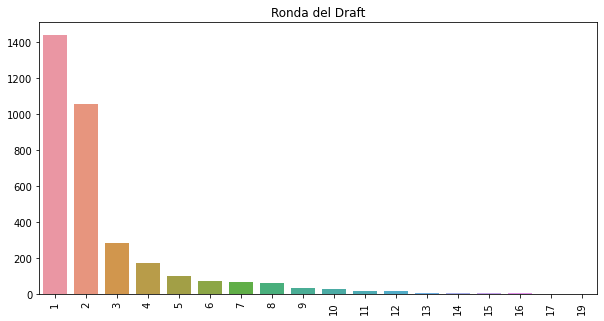

In [51]:
subset = players['draft_round'].value_counts()

plt.figure(figsize=(10,5))
plt.title('Ronda del Draft')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*La mayoría de los jugadores de la NBA fueron seleccionados entre la primera y quinta ronda del Draft*

####Año

In [52]:
players['draft_year'].value_counts()

1968    79
1970    76
1967    69
1971    69
1974    67
        ..
1962     2
1964     2
1951     1
1958     1
1963     1
Name: draft_year, Length: 87, dtype: int64

In [53]:
#Corroboramos que todos los valores del atributo draft_year correspondan efectivamente a años
players['draft_year'].unique()

array(['1990', '1968', '1969', '1997', '1996', '1976', 1956, nan, '2013',
       '2005', 1953, '1985', '2012', '1975', '1970', '1972', '2006',
       '2014', '1986', '2017', '2007', '1981', '1967', '2008', '1966',
       '2010', '1959', '1982', '1995', '2000', '1991', '1987', '2018',
       '2011', '2004', '1971', '1980', '1994', '1998', '2002', '1965',
       '1974', '2015', '1977', '1988', '1989', '1984', '1954', '2003',
       '2001', 1950, 1955, '1955', '1960', '1983', '1999', '2009', 1948,
       '1952', '1979', '1993', '2016', '1973', 1949, '1964', '1951',
       '1992', '1978', '1962', '1961', 1947, '1958', '1957', '1963', 1965,
       1952, '1948', 1959, '1950', '1947', 1962, '1953', '1949', '1956',
       1964, 1958, 1951, 1963], dtype=object)

In [54]:
for i in range(len(players)):
  if(not pd.isna(players['draft_year'][i])):
    players['draft_year'][i] = int(players['draft_year'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


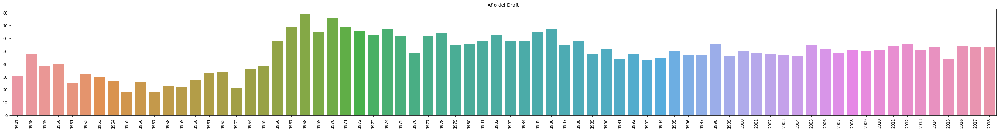

In [55]:
subset = players['draft_year'].value_counts()

plt.figure(figsize=(45,5))
plt.title('Año del Draft')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*Podemos notar que a medida que pasaron los años, más jugadores fueron incorporados a la NBA por año (o al menos fueron incorporados en este registro). Los ingresos totales por año luego de 1990, se mantuvieron relativamente constantes*

####Equipo

In [56]:
players['draft_team'].value_counts()

New York Knicks                      190
Boston Celtics                       172
Chicago Bulls                        157
Detroit Pistons                      153
Philadelphia 76ers                   150
                                    ... 
New Orleans/Oklahoma City Hornets      4
Indianapolis Jets                      4
Toronto Huskies                        3
Capital Bullets                        3
Pittsburgh Ironmen                     1
Name: draft_team, Length: 65, dtype: int64

In [57]:
#Verificamos si existe alguna palabra clave de otro campo que haya sido erroneamente dispuesta en este atributo

players['draft_team'].unique()

array(['Portland Trail Blazers', 'Cincinnati Royals', 'Milwaukee Bucks',
       'Denver Nuggets', 'Sacramento Kings', 'Vancouver Grizzlies',
       'Los Angeles Lakers', 'Syracuse Nationals', nan,
       'Oklahoma City Thunder', 'Detroit Pistons', 'New York Knicks',
       'Dallas Mavericks', 'Toronto Raptors', 'Phoenix Suns',
       'San Diego Rockets', 'New Jersey Nets', 'Memphis Grizzlies',
       'Miami Heat', 'Boston Celtics', 'Charlotte Bobcats',
       'Los Angeles Clippers', 'New Orleans Hornets', 'Chicago Bulls',
       'San Antonio Spurs', 'Orlando Magic', 'Golden State Warriors',
       'San Francisco Warriors', 'Utah Jazz', 'Brooklyn Nets',
       'Minnesota Timberwolves', 'Philadelphia 76ers',
       'Seattle SuperSonics', 'Baltimore Bullets', 'Atlanta Hawks',
       'Cleveland Cavaliers', 'Washington Bullets', 'Indiana Pacers',
       'San Diego Clippers', 'Philadelphia Warriors', 'Rochester Royals',
       'Houston Rockets', 'New Orleans/Oklahoma City Hornets',
       'F

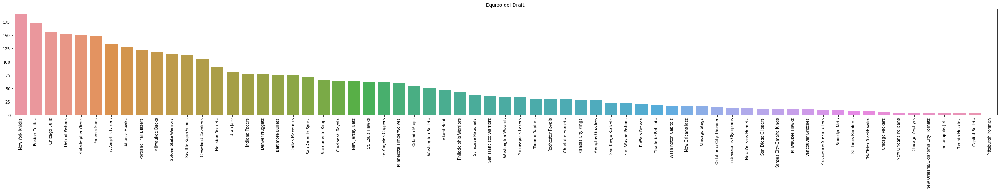

In [58]:
subset = players['draft_team'].value_counts()

plt.figure(figsize=(45,5))
plt.title('Equipo del Draft')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*Podemos notar que hay equipos como los **New York Nicks** y los **Boston Celtics** que han adquirido más jugadores en el proceso de Draft a lo largo de las temporadas evaluadas en este conjunto de datos*

###Posición



*   *Center*  : Pívot
*   *Shooting Guard* : Escolta
*   *Point Guard* : Base
*   *Small Forward* : Alero
*   *Power Forward* : Ala-Pívot



In [59]:
players['position'].value_counts()

Shooting Guard                                                        679
Center                                                                613
Small Forward                                                         611
Point Guard                                                           584
Power Forward                                                         521
Point Guard and Shooting Guard                                        177
Guard                                                                 163
Forward                                                               162
Center and Power Forward                                              162
Power Forward and Center                                              161
Shooting Guard and Point Guard                                        143
Power Forward and Small Forward                                       134
Shooting Guard and Small Forward                                      128
Small Forward and Shooting Guard      

In [60]:
#Adoptamos una única nomenclatura para referir a las posiciones
#NOTA: Cuando sólo aparece la palabra Guard o solo aparece la palabra Forward le vamos a asignar ambos (Guard = Shooting Guard + Point Guard y Forward = Small Forward + Power Forward)

players['SG'] = '' #Shooting Guard
players['PG']= '' #Point Guard
players['SF'] = '' #Small Forward
players['PF'] = '' #Power Forward
players['C'] = '' #Center
players['reformedPositions'] = ''
players['numPositions'] = ''


for i in range(len(players)):
    n = 0
    position_lists = []
    if('Shooting Guard' in players['position'][i]):
      players['SG'][i] = 1
      n +=1
      position_lists.append('SG')
    else:
      players['SG'][i] = 0

    if('Point Guard' in players['position'][i]):
      players['PG'][i] = 1
      n +=1
      position_lists.append('PG')
    else:
      players['PG'][i] = 0

    if('Small Forward' in players['position'][i]):
      players['SF'][i] = 1
      position_lists.append('SF')
      n +=1
    else:
      players['SF'][i] = 0

    if('Power Forward' in players['position'][i]):
      players['PF'][i] = 1
      position_lists.append('PF')
      n +=1
    else:
      players['PF'][i] = 0

    if('Center' in players['position'][i]):
      players['C'][i] = 1
      position_lists.append('C')
      n +=1
    else:
      players['C'][i] = 0

    if('Shooting Guard' not in players['position'][i] and 'Point Guard' not in players['position'][i] and 'Guard' in players['position'][i]):
      players['SG'][i] = 1
      players['PG'][i] = 1
      n +=2
      position_lists.append('SG')
      position_lists.append('PG')
    
    if('Small Forward' not in players['position'][i] and 'Power Forward' not in players['position'][i] and 'Forward' in players['position'][i]):
      players['SF'][i] = 1
      players['PF'][i] = 1
      n +=2
      position_lists.append('SF')
      position_lists.append('PF')
    
    players['reformedPositions'][i] = sorted(position_lists)
    players['numPositions'][i] = n

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to b

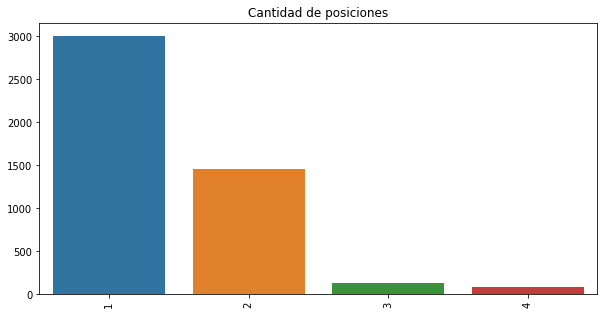

In [61]:
subset = players['numPositions'].value_counts()

plt.figure(figsize=(10,5))
plt.title('Cantidad de posiciones')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

<BarContainer object of 5 artists>

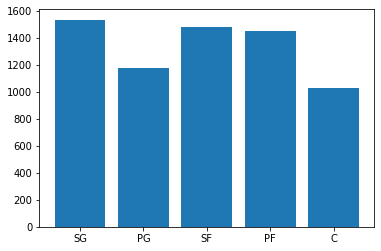

In [62]:
#Investigamos si hay puestos más cubiertos y otros menos, que nos permita identificar si existen puestos más requeridos que otros
items = ['SG', 'PG', 'SF', 'PF', 'C']
values = [len(players[players[x]==1]) for x in items]
plt.bar(items, values)

###Lateralidad de los tiros

In [63]:
players['shoots'].value_counts()

Right         4400
Left           283
Left Right       1
Name: shoots, dtype: int64

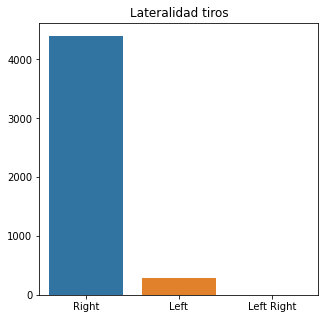

In [64]:
subset = players['shoots'].value_counts()

plt.figure(figsize=(5,5))
plt.title('Lateralidad tiros')
plt.xticks(rotation=0)

sns.barplot(x=subset.index,y=subset.values)

###Altura

In [65]:
#Altura en pies y pulgadas
players['height'].value_counts()

6-7     486
6-8     441
6-9     439
6-5     436
6-6     415
6-3     412
6-4     358
6-2     334
6-10    334
6-1     233
6-11    232
7-0     171
6-0     149
5-11     62
7-1      54
5-10     48
7-2      27
5-9      15
7-3      13
5-7       6
7-4       4
7-5       4
5-8       3
7-6       2
5-3       2
5-6       2
7-7       2
5-5       1
Name: height, dtype: int64

In [66]:
#Función para transformar al SI
def FeetInches2cm(feet, inches):

  total_inches = inches + feet * 12
  cm = round(total_inches* 2.54,1)
  return cm

In [67]:
#Transformamos este atributo en centímetros para facilitar su interpretación
players['height_cm'] = ''
for i in range(len(players)):
  #try:    
    feet = int(players['height'][i][:players['height'][i].find('-')])
    inches = int(players['height'][i][players['height'][i].find('-')+1:])
    players['height_cm'][i] = FeetInches2cm(feet,inches)
  #except:
    #print(players['height'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


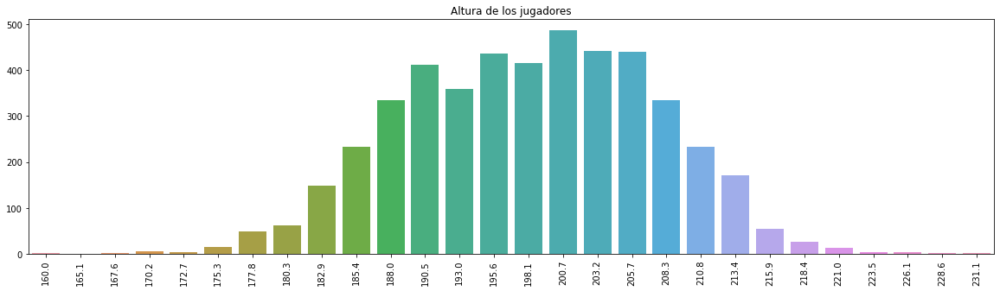

In [68]:
subset = players['height_cm'].value_counts()

plt.figure(figsize=(20,5))
plt.title('Altura de los jugadores')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*Notamos que la mayoría de los jugadores miden cerca de 2 metros*

###Peso

In [69]:
#El peso se encuentra descrito en libras
players['weight'].value_counts() 

210lb    334
190lb    321
185lb    313
220lb    294
215lb    263
        ... 
288lb      1
152lb      1
308lb      1
114lb      1
140lb      1
Name: weight, Length: 143, dtype: int64

In [70]:
#Función para transformar al SI
def pounds2kg(pounds):
  kg = round(pounds * 0.453592, 1)
  return kg

In [71]:
#Transformación de los valores de peso a kilgramos
players['weight_kg']=''
for i in range(len(players)):

  try:
    players['weight_kg'][i] = pounds2kg(int(players['weight'][i].replace('lb','')))
  except:
    players['weight_kg'][i] = np.nan

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


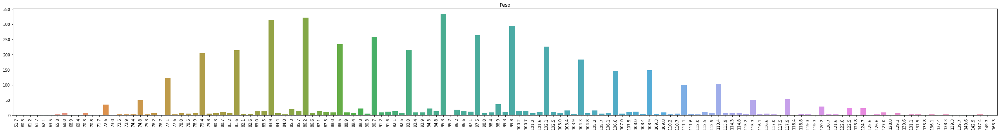

In [72]:
subset = players['weight_kg'].value_counts()

plt.figure(figsize=(45,5))
plt.title('Peso')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*Notamos que la distribución de pesos es bastante heterogénea, con la mayoría de los casos concentrados entre 80 y 110 kilogramos*

###IMC

In [73]:
#Incorporamos una medida de resumen del peso y la estatura
def IMC(height, weight):
  height = height/100
  imc = weight /(height**2)
  return round(imc, 1)

In [74]:
players['IMC']=''

for i in range(len(players)):
  try:
    players['IMC'][i] = IMC(players['height_cm'][i], players['weight_kg'][i])
  except:
    print(players['height_cm'][i], players['weight_kg'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


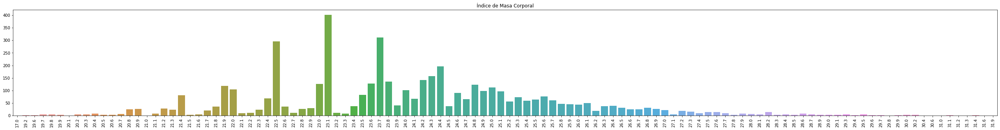

In [75]:
subset = players['IMC'].value_counts()

plt.figure(figsize=(45,5))
plt.title('Índice de Masa Corporal')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*La mayoría de los IMC se encuentran entre 21.8 y 24.9 que corresponden al rango normal (18.5-24.9). Encontramos también un número importante de jugadores que de acuerdo al IMC presentarían sobrepeso*

##Dataset de salarios

In [76]:
salaries = pd.read_csv("https://raw.githubusercontent.com/emmanueliarussi/DataScienceCapstone/master/3_MidtermProjects/ProjectNBA/data/salaries_1985to2018.csv")
salaries

,league,player_id,salary,season,season_end,season_start,team
0,NBA,abdelal01,395000,1990-91,1991,1990,Portland Trail Blazers
1,NBA,abdelal01,494000,1991-92,1992,1991,Portland Trail Blazers
2,NBA,abdelal01,500000,1992-93,1993,1992,Boston Celtics
3,NBA,abdelal01,805000,1993-94,1994,1993,Boston Celtics
4,NBA,abdelal01,650000,1994-95,1995,1994,Sacramento Kings
...,...,...,...,...,...,...,...
14158,NBA,zipsepa01,750000,2016-17,2017,2016,Chicago Bulls
14159,NBA,zipsepa01,1312611,2017-18,2018,2017,Chicago Bulls
14160,NBA,zizican01,1645200,2017-18,2018,2017,Cleveland Cavaliers
14161,NBA,zubaciv01,1034956,2016-17,2017,2016,Los Angeles Lakers


###Liga

In [77]:
salaries['league'].value_counts()

NBA    14163
Name: league, dtype: int64

*Todos los registros corresponden a jugadores de la NBA*

###Temporadas

In [78]:
n=0
for i in range(len(salaries)):
  end = int(salaries['season_end'][i])
  start = int(salaries['season_start'][i])
  if(end-start !=1):
    print(start, end)
    n+=1

if(n==0):
  print('Todas las temporadas corresponden al período de 1 año')

Todas las temporadas corresponden al período de 1 año


In [79]:
print('La primera temporada comenzó en el año %d y la última registrada en el año %d' %(salaries['season_start'].min(), salaries['season_start'].max()))

La primera temporada comenzó en el año 1984 y la última registrada en el año 2017


In [80]:
print('Tenemos para trabajar con %d temporadas' %(salaries['season_start'].max() - salaries['season_start'].min()))

Tenemos para trabajar con 33 temporadas


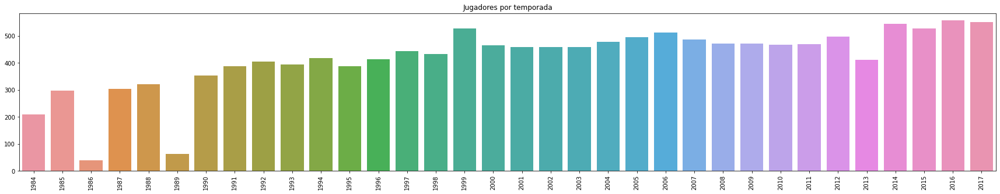

In [81]:
subset = salaries['season_start'].value_counts()

plt.figure(figsize=(30,5))
plt.title('Jugadores por temporada')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*En general, al pasar los años se detecta un incremento en la cantidad de jugadores que participan de las temporadas.*

###Equipos

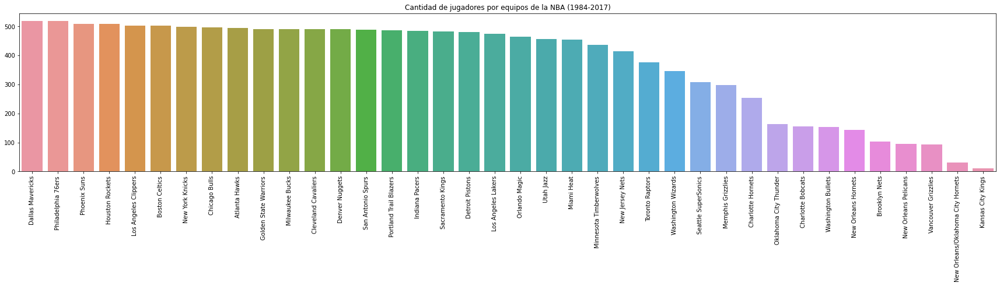

In [82]:
subset = salaries['team'].value_counts()

plt.figure(figsize=(30,5))
plt.title('Cantidad de jugadores por equipos de la NBA (1984-2017)')
plt.xticks(rotation=90)

sns.barplot(x=subset.index,y=subset.values)

*Podemos notar que equipos como los **Philadelphia 76ers** y los **Dallas Mavericks**, entre otros, poseen más registros en este conjunto de datos. Esto puede traducirse en que han mantenido los contratos de sus jugadores por muchos años o porque presentan un recambio mayor de jugadores*

###Salarios

In [83]:
salaries['salary'].value_counts()

1000000     179
150000      126
3000000     125
4000000     107
500000      105
           ... 
14956522      1
945360        1
2319344       1
2661027       1
2048000       1
Name: salary, Length: 6091, dtype: int64

In [84]:
max = salaries['salary'].max()
idx = salaries[salaries['salary'] == max].index[0]
season = salaries['season'][idx]
player_id = salaries['player_id'][idx]
player_name = players[players['_id'].str.contains(player_id)]['name']
name = player_name[player_name.index[0]]

print('El mayor salario corresponde a %s, durante la temporada %s y fue de USD %d' %(name, season, max))


El mayor salario corresponde a Stephen Curry, durante la temporada 2017-18 y fue de USD 34682550


In [85]:
min = salaries['salary'].min()
idx = salaries[salaries['salary'] == min].index[0]
season = salaries['season'][idx]
player_id = salaries['player_id'][idx]
player_name = players[players['_id'].str.contains(player_id)]['name']
name = player_name[player_name.index[0]]

print('El menor salario corresponde a %s, durante la temporada %s y fue de USD %d' %(name, season, min))

El menor salario corresponde a Jason Sasser, durante la temporada 1999-00 y fue de USD 2706


In [86]:
#Creamos un diccionario para normalizar los salarios a lo largo de las temporadas

season_salary = {}

for i,v in enumerate(salaries['season_start'].unique()):
  
  subset = salaries[salaries['season_start'] == v]
  mean = subset['salary'].mean()
  std = subset['salary'].std()

  season_salary[v] = [mean,std]

season_salary

{1984: [398804.7619047619, 343640.32740405196],
 1985: [370103.3952702703, 340629.54481114325],
 1986: [543033.325, 385118.9170999995],
 1987: [459204.31353135314, 410417.5783553829],
 1988: [528010.9750778816, 471670.7116855524],
 1989: [1670937.5, 646427.8369723093],
 1990: [831623.2294617564, 660061.7027147366],
 1991: [954346.2532299742, 800249.866422993],
 1992: [1061757.8712871287, 876176.055349984],
 1993: [1269884.1751269035, 977938.8774792558],
 1994: [1360403.9114832536, 1161800.1145514753],
 1995: [1734345.3608247424, 1675939.9736107436],
 1996: [1935172.397094431, 2465440.471479892],
 1997: [2121414.975225225, 2769253.9703390836],
 1998: [2456729.141203704, 2692681.3455767757],
 1999: [2498707.574144487, 3057339.729382454],
 2000: [3236010.808189655, 3467070.957169423],
 2001: [3395648.4836601308, 3688108.6686033155],
 2002: [3636157.9673202615, 4034786.0406405483],
 2003: [3650913.8558951966, 4008431.846937167],
 2004: [3705739.5543933054, 3954779.7667752975],
 2005: [3839

In [87]:
#Normalización de los salarios

salaries['norm_salary']=''

for i in range(len(salaries)):
  season = salaries['season_start'][i]
  salary = salaries['salary'][i]
  norm_salary = (salary-season_salary[season][0])/season_salary[season][1]
  salaries['norm_salary'][i] = float(round(norm_salary, 3))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [88]:
np.arange(1984,2018,1)

array([1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993, 1994,
       1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004, 2005,
       2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016,
       2017])

<Figure size 432x288 with 0 Axes>

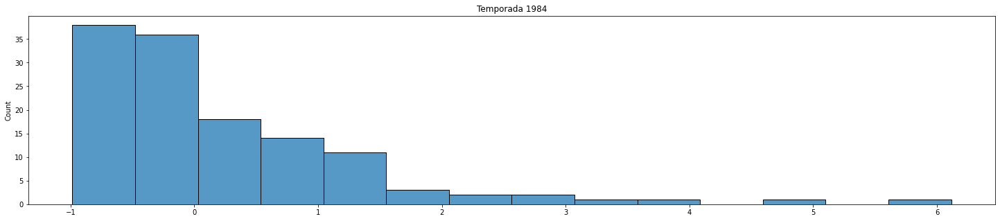

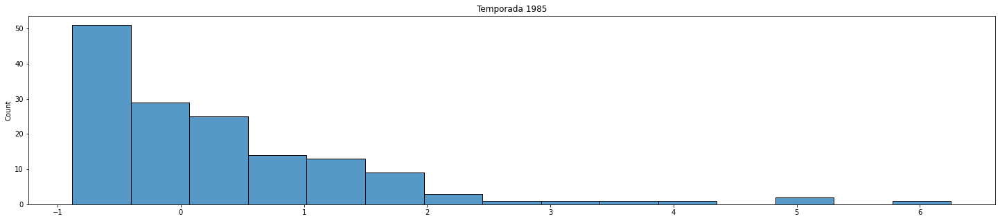

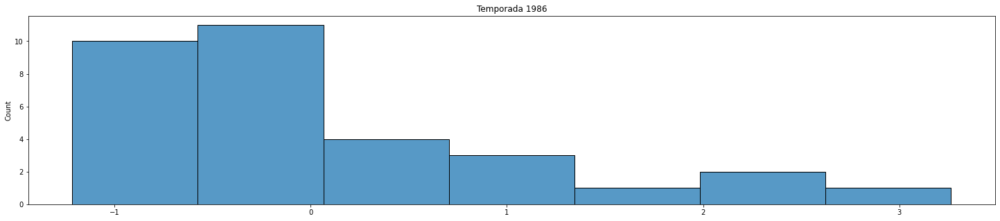

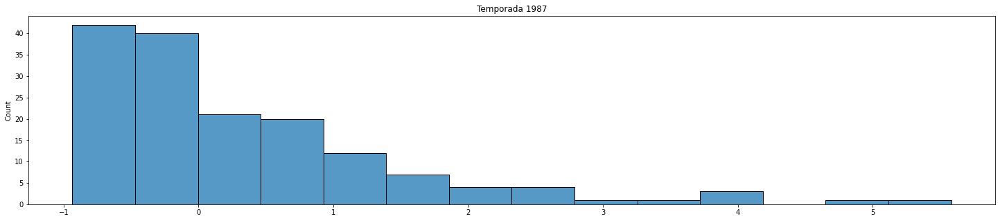

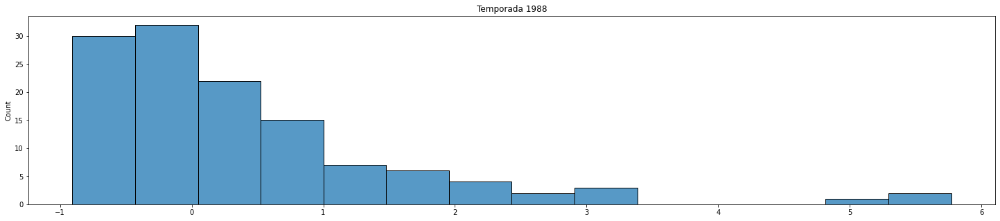

...

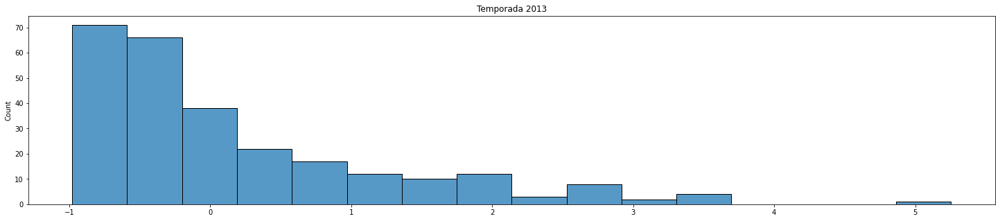

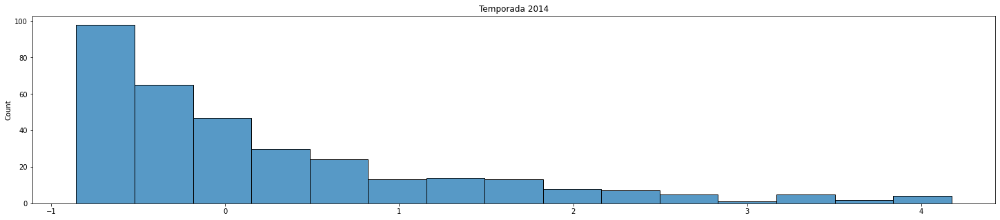

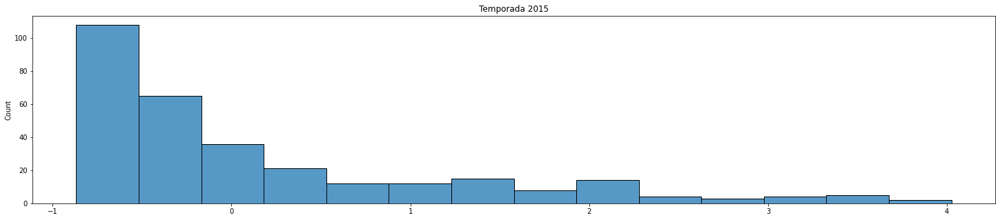

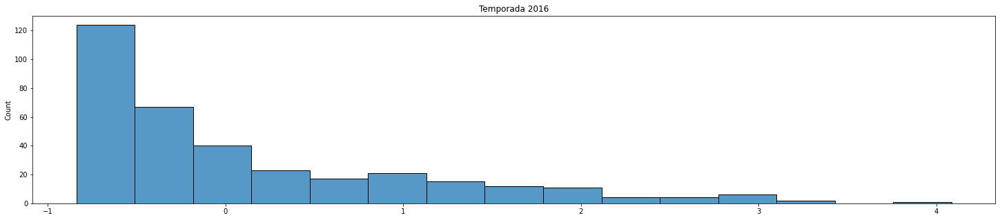

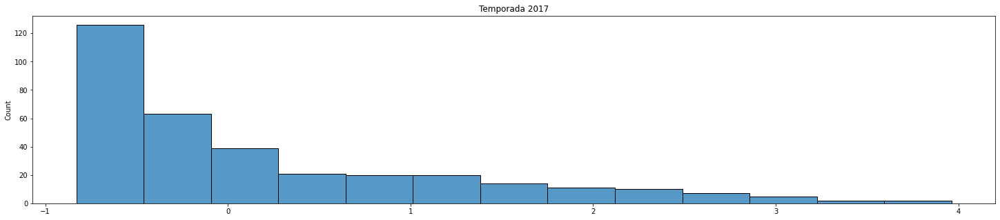

In [89]:
plt.subplots_adjust(hspace=1.0)
number_of_subplots=33
initial_year = 1984

for i,v in enumerate (np.arange(1984,2018,1)):
    plt.figure(figsize=(25, 5))

    subset = salaries[salaries["season_start"] == v]
    subset = subset['norm_salary'].value_counts()
    plt.title('Temporada %d' %(v))
    sns.histplot(x=subset.index)
    plt.show()
   
  

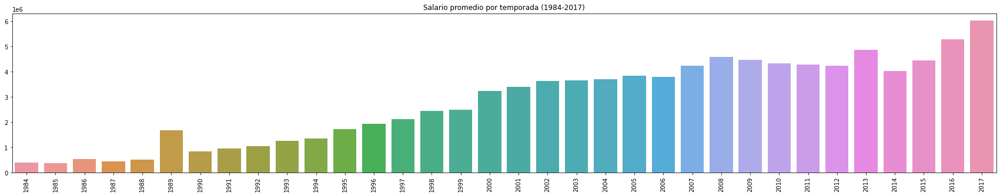

In [90]:
#Distribución de salarios promedio por año
seasons = list(season_salary.keys())
prom_salary = [season_salary[x][0] for x in seasons]

plt.figure(figsize=(30,5))
plt.title('Salario promedio por temporada (1984-2017)')
plt.xticks(rotation=90)

sns.barplot(x=seasons,y=prom_salary)


*Con excepción del año 1989 en el cual el salario promedio es superior al de los años inmediatamente posteriores (probablemente por un salario extremadamente alto y no habitual en uno o más jugadores), se observa un incremento del salario promedio en el transcurso de las 33 temporadas evaluadas*

##Dataset Unificado

In [91]:
players.columns

Index(['_id', 'birthDate', 'birthPlace', 'career_AST', 'career_FG%',
       'career_FG3%', 'career_FT%', 'career_G', 'career_PER', 'career_PTS',
       'career_TRB', 'career_WS', 'career_eFG%', 'college', 'draft_pick',
       'draft_round', 'draft_team', 'draft_year', 'height', 'highSchool',
       'name', 'position', 'shoots', 'weight', 'birthYear', 'country', 'SG',
       'PG', 'SF', 'PF', 'C', 'reformedPositions', 'numPositions', 'height_cm',
       'weight_kg', 'IMC'],
      dtype='object')

In [92]:
salaries.columns

Index(['league', 'player_id', 'salary', 'season', 'season_end', 'season_start',
       'team', 'norm_salary'],
      dtype='object')

In [93]:
df = salaries.copy()

#Incorporo columnas que me interesan del otro dataset
df['career_AST'] = ''
df['career_FG%'] = ''
df['career_FG3%'] = ''
df['career_FT%'] = ''
df['career_G'] = ''
df['career_PER'] = ''
df['career_PTS'] = ''
df['career_TRB'] = ''
df['career_WS'] = ''
df['career_eFG%'] = ''
df['draft_pick'] = ''
df['draft_round'] = ''
df['draft_team'] = ''
df['draft_year'] = ''
df['position'] = ''
df['shoots'] = ''
df['actual_age'] = '' #Edad actual del jugador (año de temporada - año de nacimiento)
df['season_number'] = '' #Número de temporada que lleva jugando en la NBA (año de tempoarada - año de draft)
df['country'] = ''
df['reformedPositions'] = ''
df['numPositions'] = ''
df['height_cm'] = ''
df['weight_kg'] = ''
df['IMC'] = ''
df['prev_salary'] = '' #Salario del jugador en el año previo
df['prev_norm_salary'] = '' #Salario del jugador en el año previo (normalizado a la temporada)

In [94]:
for i in range(len(salaries)):
  id = salaries['player_id'][i]
  idx = players[players['_id'] == id].index[0]

  df['career_AST'][i] = players['career_AST'][idx] 
  df['career_FG%'][i] = players['career_FG%'][idx]
  df['career_FG3%'][i] = players['career_FG3%'][idx]
  df['career_FT%'][i] = players['career_FT%'][idx]
  df['career_G'][i] = players['career_G'][idx]
  df['career_PER'][i] = players['career_PER'][idx]
  df['career_PTS'][i] = players['career_PTS'][idx]
  df['career_TRB'][i] = players['career_TRB'][idx]
  df['career_WS'][i] = players['career_WS'][idx]
  df['career_eFG%'][i] = players['career_eFG%'][idx]
  df['draft_pick'][i] = players['draft_pick'][idx]
  df['draft_round'][i] = players['draft_round'][idx]
  df['draft_team'][i] = players['draft_team'][idx]
  df['draft_year'][i] = players['draft_year'][idx]
  df['position'][i] = players['position'][idx]
  df['shoots'][i] = players['shoots'][idx]
  df['actual_age'][i] = salaries['season_start'][i] - players['birthYear'][idx] 
  df['season_number'][i] = 1+ (salaries['season_start'][i] - players['draft_year'][idx])
  df['country'][i] = players['country'][idx]
  df['reformedPositions'][i] = players['reformedPositions'][idx]
  df['numPositions'][i] = players['numPositions'][idx]
  df['height_cm'][i] = players['height_cm'][idx]
  df['weight_kg'][i] = players['weight_kg'][idx]
  df['IMC'][i] = players['IMC'][idx]



/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A va

In [95]:
for i in range(len(df)):
  if(i==0):
    df['prev_salary'][i] = 0
    df['prev_norm_salary'][i] = 0
  else:
    if(df['player_id'][i] == df['player_id'][i-1]):
      df['prev_salary'][i] = df['salary'][i-1]
      df['prev_norm_salary'][i] = df['norm_salary'][i-1]
    else:
      df['prev_salary'][i] = 0
      df['prev_norm_salary'][i] = 0

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-

In [96]:
df.head()

,league,player_id,salary,season,season_end,season_start,team,norm_salary,career_AST,career_FG%,career_FG3%,career_FT%,career_G,career_PER,career_PTS,career_TRB,career_WS,career_eFG%,draft_pick,draft_round,draft_team,draft_year,position,shoots,actual_age,season_number,country,reformedPositions,numPositions,height_cm,weight_kg,IMC,prev_salary,prev_norm_salary
0,NBA,abdelal01,395000,1990-91,1991,1990,Portland Trail Blazers,-0.661,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,25,1,Portland Trail Blazers,1990,Power Forward,Right,22,1,others,[PF],1,208.3,108.9,25.1,0,0
1,NBA,abdelal01,494000,1991-92,1992,1991,Portland Trail Blazers,-0.575,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,25,1,Portland Trail Blazers,1990,Power Forward,Right,23,2,others,[PF],1,208.3,108.9,25.1,395000,-0.661
2,NBA,abdelal01,500000,1992-93,1993,1992,Boston Celtics,-0.641,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,25,1,Portland Trail Blazers,1990,Power Forward,Right,24,3,others,[PF],1,208.3,108.9,25.1,494000,-0.575
3,NBA,abdelal01,805000,1993-94,1994,1993,Boston Celtics,-0.475,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,25,1,Portland Trail Blazers,1990,Power Forward,Right,25,4,others,[PF],1,208.3,108.9,25.1,500000,-0.641
4,NBA,abdelal01,650000,1994-95,1995,1994,Sacramento Kings,-0.611,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,25,1,Portland Trail Blazers,1990,Power Forward,Right,26,5,others,[PF],1,208.3,108.9,25.1,805000,-0.475


In [97]:
#Eliminamos todos los atirbutos que sabemos que sustituimos o que creemos que no nos serán útiles

df.drop('league', axis=1, inplace=True)
df.drop('season', axis=1, inplace=True)
df.drop('season_end', axis=1, inplace=True)
df.drop('position', axis=1, inplace=True)


In [98]:
#df.to_csv('/content/gdrive/My Drive/NBA.csv', index=False)

#Regresión empleando sólo atributos numéricos

#### Análisis del Dataset

In [99]:
df_num = df.copy()

In [100]:
df_num.columns

Index(['player_id', 'salary', 'season_start', 'team', 'norm_salary',
       'career_AST', 'career_FG%', 'career_FG3%', 'career_FT%', 'career_G',
       'career_PER', 'career_PTS', 'career_TRB', 'career_WS', 'career_eFG%',
       'draft_pick', 'draft_round', 'draft_team', 'draft_year', 'shoots',
       'actual_age', 'season_number', 'country', 'reformedPositions',
       'numPositions', 'height_cm', 'weight_kg', 'IMC', 'prev_salary',
       'prev_norm_salary'],
      dtype='object')

In [101]:
#Nos quedamos sólo con los valores numéricos

df_num.drop('team', axis=1, inplace=True)
df_num.drop('draft_team', axis=1, inplace=True)
df_num.drop('shoots', axis=1, inplace=True)
df_num.drop('country', axis=1, inplace=True)
df_num.drop('reformedPositions', axis=1, inplace=True)

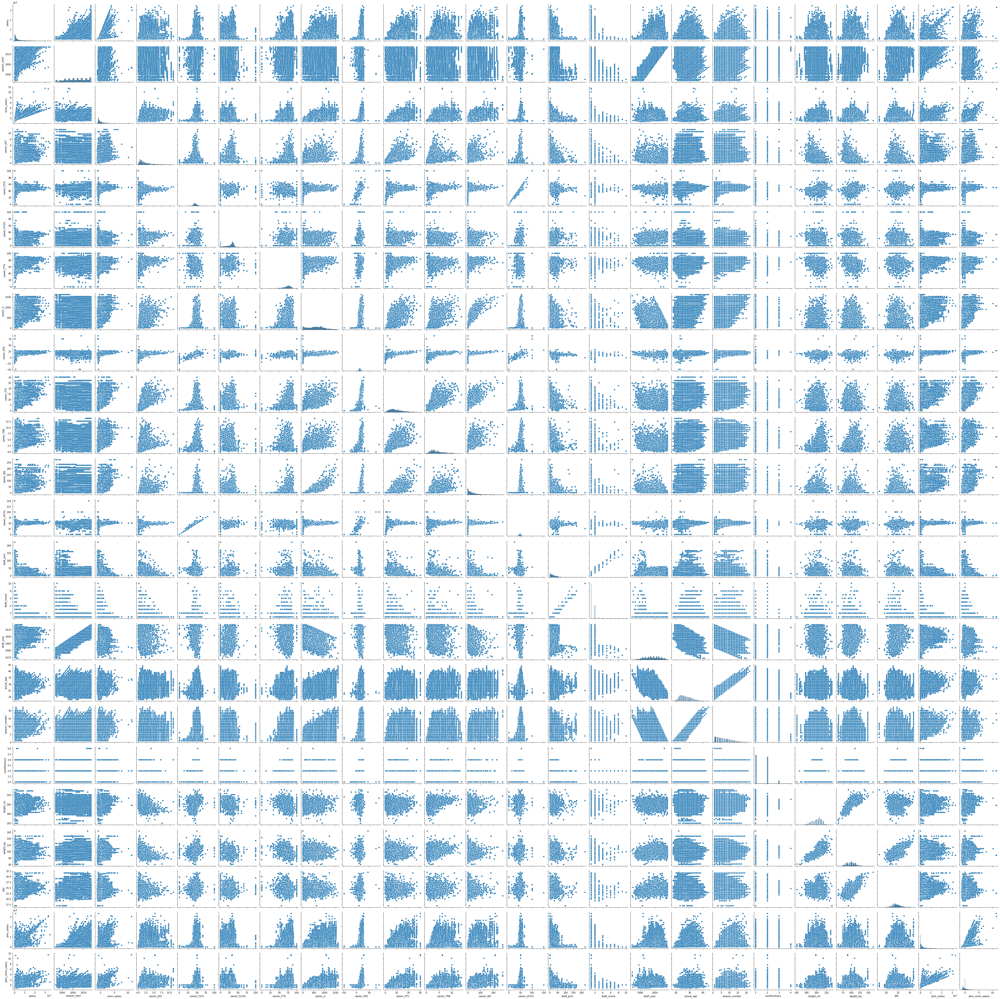

In [102]:
sns.pairplot(df_num)

####Eliminación de filas con datos desconocidos

In [103]:
#Filtramos las filas que no se encuentran totalmente completas
print('Total inicial de filas ', len(df_num))
df_num.dropna(inplace=True)
print('Total de filas luego de eliminar aquellas que no estaban totalmente completas ', len(df_num))

Total inicial de filas  14163
Total de filas luego de eliminar aquellas que no estaban totalmente completas  11921


###Normalización

In [104]:
x_list = []

for i,v in enumerate(df_num.columns):
  if('salary'!=v and 'norm_salary'!=v and 'player_id' not in v):
    x_list.append(v)

x_list

['season_start',
 'career_AST',
 'career_FG%',
 'career_FG3%',
 'career_FT%',
 'career_G',
 'career_PER',
 'career_PTS',
 'career_TRB',
 'career_WS',
 'career_eFG%',
 'draft_pick',
 'draft_round',
 'draft_year',
 'actual_age',
 'season_number',
 'numPositions',
 'height_cm',
 'weight_kg',
 'IMC',
 'prev_salary',
 'prev_norm_salary']

In [105]:
#Separamos atributos (X), de variable de salida y para la cual tenemos dos opciones (salario y salario normalizado por temporada)
#Empleamos el id del jugador para hacer la partición train/test de manera que un mismo jugador quede en un sólo conjunto
X_original = df_num[x_list]
y_original = df_num['salary']
y_original2 = df_num['norm_salary']
groups = df_num['player_id']

In [106]:
def pre_norm(X,y,normalize = False):

  if (normalize==True): #con normalización previa
    scaler = MinMaxScaler() 
    X_pre = scaler.fit_transform(X)
    y_pre = np.array(y)

  else: #sin normalización previa
    X_pre = np.array(X)
    y_pre = np.array(y)

  return X_pre,y_pre

In [107]:
X,y = pre_norm(X_original, y_original, True) #normalizo
X2,y2 = pre_norm(X_original, y_original2, True) #normalizo

#X,y = pre_norm(X_original, y_original, False) #no normalizo

###Partición Train-Test (*player-wise*)


In [108]:
#hacemos un group shuffle split para que los jugadores nos queden en disitntos subsets
gss = GroupShuffleSplit(n_splits=1, test_size=0.30, random_state=0)
for train_idx, test_idx in gss.split(X, y, groups=groups):
  print(train_idx,test_idx)


[    0     1     2 ... 11916 11917 11918] [    5     6     7 ... 11908 11919 11920]


In [109]:
print('En entrenamiento hay %d jugadores distintos y un total de %d observaciones' %(len(df_num.iloc[train_idx]['player_id'].unique()), len(train_idx)))
print('En testeo hay %d jugadores distintos y un total de %d observaciones' %(len(df_num.iloc[test_idx]['player_id'].unique()), len(test_idx)))

En entrenamiento hay 1223 jugadores distintos y un total de 8261 observaciones
En testeo hay 525 jugadores distintos y un total de 3660 observaciones


###Ajuste de Modelos Lineales y No Lineales

In [110]:
#Probamos con varios modelos en su configuración por default

linear_model_1 = LinearRegression()
linear_model_2 = Ridge()
linear_model_3 = RidgeCV() 
linear_model_4 = Lasso()
linear_model_5 = ElasticNet()
linear_model_6 = LassoLars()

In [111]:
linear_model_list = [linear_model_1, linear_model_2, linear_model_3, linear_model_4, linear_model_5, linear_model_6]
linear_model_list

[LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False),
 Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001),
 RidgeCV(alphas=array([ 0.1,  1. , 10. ]), cv=None, fit_intercept=True,
         gcv_mode=None, normalize=False, scoring=None, store_cv_values=False),
 Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
       normalize=False, positive=False, precompute=False, random_state=None,
       selection='cyclic', tol=0.0001, warm_start=False),
 ElasticNet(alpha=1.0, copy_X=True, fit_intercept=True, l1_ratio=0.5,
            max_iter=1000, normalize=False, positive=False, precompute=False,
            random_state=None, selection='cyclic', tol=0.0001, warm_start=False),
 LassoLars(alpha=1.0, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
           fit_path=True, max_iter=500, normalize=True, positive=False,
           precompute='auto', verbose=False)]

####Ajuste con salario en unidades originales

In [112]:
X_train = X[train_idx]
y_train = y[train_idx]
X_test = X[test_idx]
y_test = y[test_idx]

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8261, 22), (8261,), (3660, 22), (3660,))

MODELO -> LinearRegression
----------------------------
score =  0.7635437487727427
MAE =  1157507.8915300546
MSE =  5069031807630.829
RMSE =  2251451.044910999


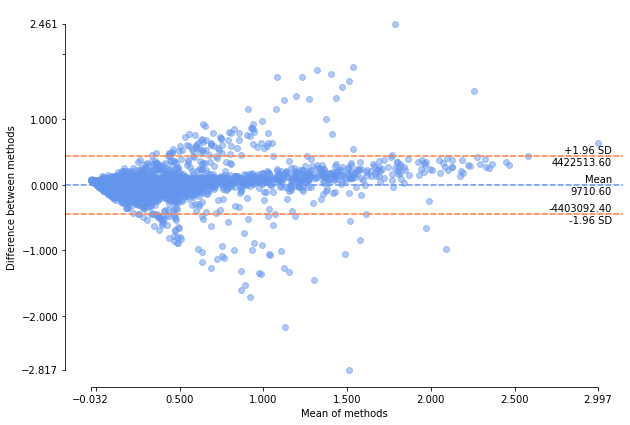



MODELO -> Ridge
----------------------------
score =  0.7633096787415883
MAE =  1169519.383977936
MSE =  5091276356267.341
RMSE =  2256385.6842896654


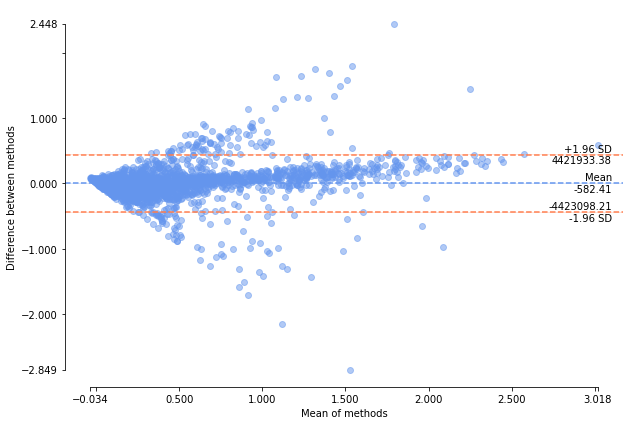



MODELO -> RidgeCV
----------------------------
score =  0.7635350746101469
MAE =  1158839.1997259706
MSE =  5071115565934.983
RMSE =  2251913.756327045


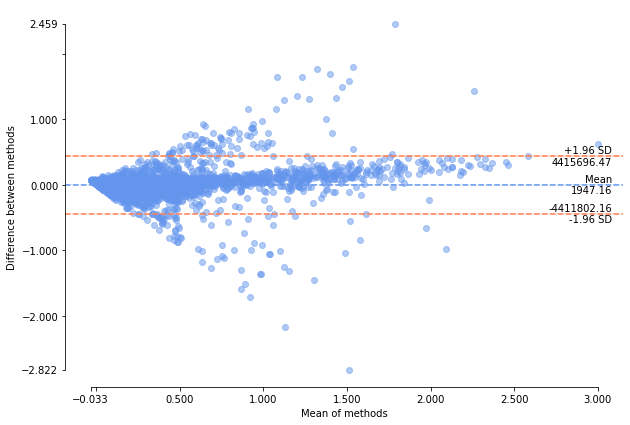



MODELO -> Lasso
----------------------------


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:476: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 1.3202005087987016e+16, tolerance: 15323296121244.521
  positive)


score =  0.7635404023845127
MAE =  1157666.0554572206
MSE =  5069014797294.231
RMSE =  2251447.267269263


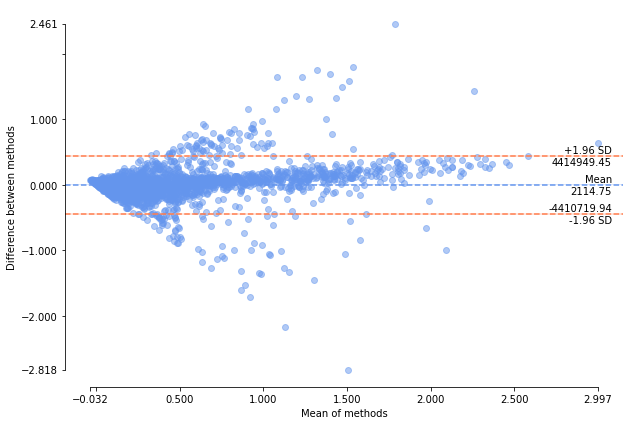



MODELO -> ElasticNet
----------------------------
score =  0.17140538487166612
MAE =  2853414.3128861333
MSE =  17352477783815.87
RMSE =  4165630.5385638643


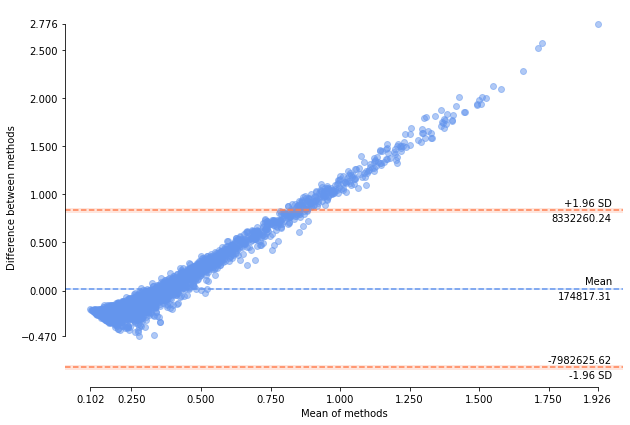



MODELO -> LassoLars
----------------------------
score =  0.7635396899653542
MAE =  1157656.689750303
MSE =  5069155854255.421
RMSE =  2251478.592892995


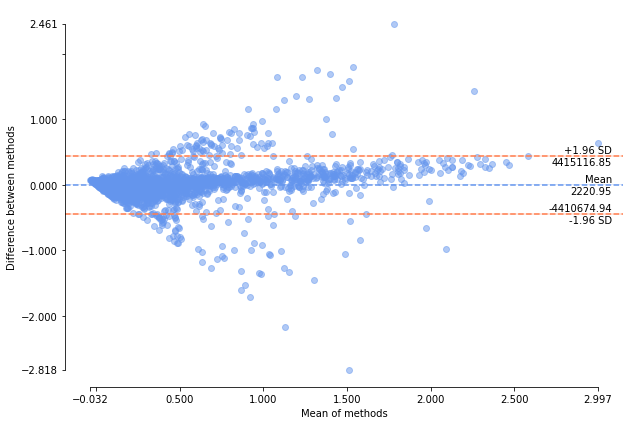

In [113]:
for i,v in enumerate(linear_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  print('score = ', lm.score(X_train,y_train))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

####Ajuste con salario normalizado por temporada

In [114]:
X_train = X2[train_idx]
y_train = y2[train_idx]
X_test = X2[test_idx]
y_test = y2[test_idx]

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8261, 22), (8261,), (3660, 22), (3660,))

MODELO -> LinearRegression
----------------------------
score =  0.6785847254995658
MAE =  0.3937078668646474
MSE =  0.46372820274951765
RMSE =  0.6809759193609695


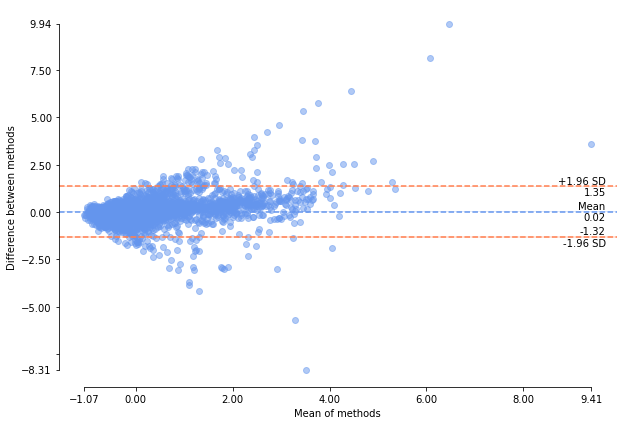



MODELO -> Ridge
----------------------------
score =  0.6783235589216217
MAE =  0.3958688819590204
MSE =  0.4646918207544962
RMSE =  0.681683079410437


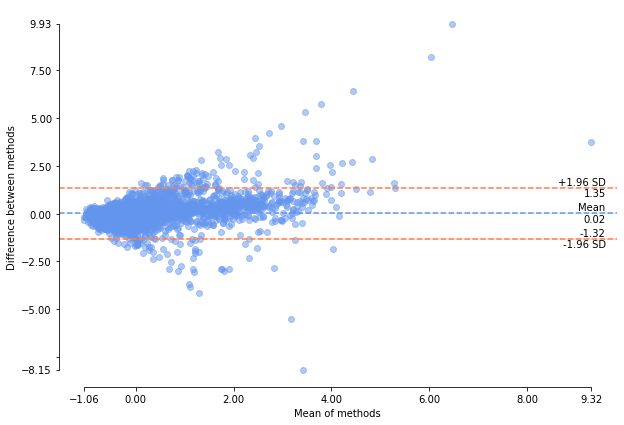



MODELO -> RidgeCV
----------------------------
score =  0.6785755928962429
MAE =  0.3938876769014339
MSE =  0.4637201230790156
RMSE =  0.6809699869150002


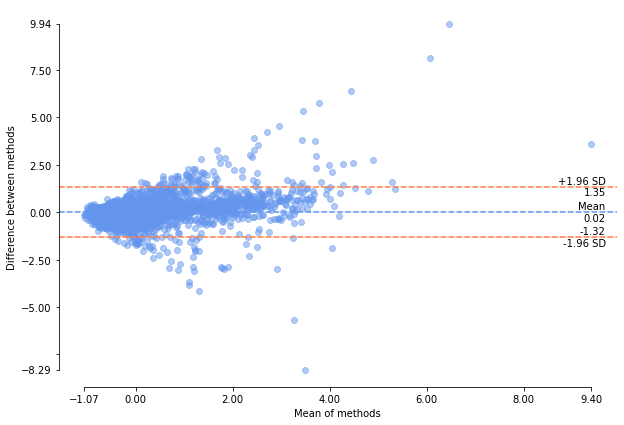



MODELO -> Lasso
----------------------------
score =  0.0
MAE =  0.8315605771870325
MSE =  1.3896851895949769
RMSE =  1.1788490953446826


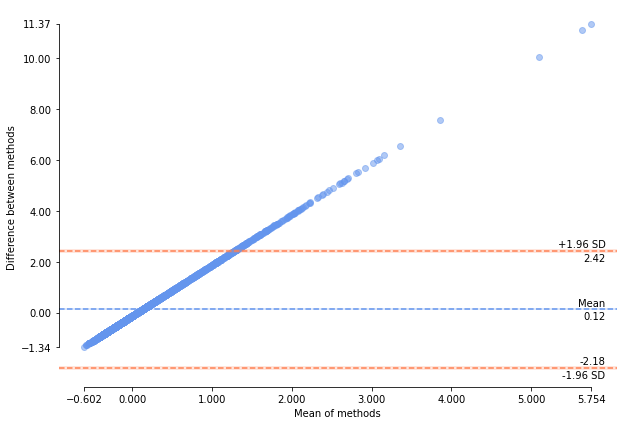



MODELO -> ElasticNet
----------------------------
score =  0.0
MAE =  0.8315605771870325
MSE =  1.3896851895949769
RMSE =  1.1788490953446826


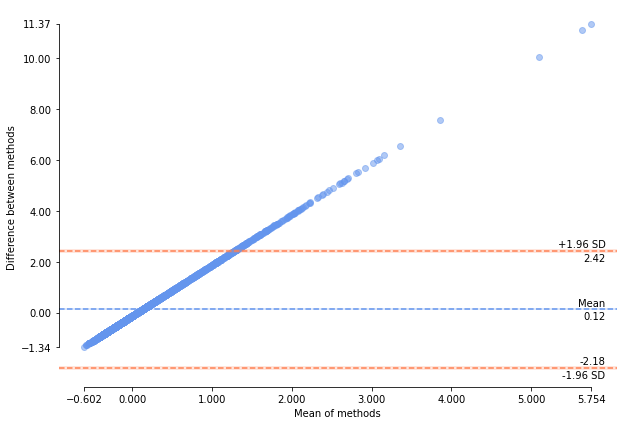



MODELO -> LassoLars
----------------------------
score =  0.0
MAE =  0.8315605771870325
MSE =  1.3896851895949769
RMSE =  1.1788490953446826


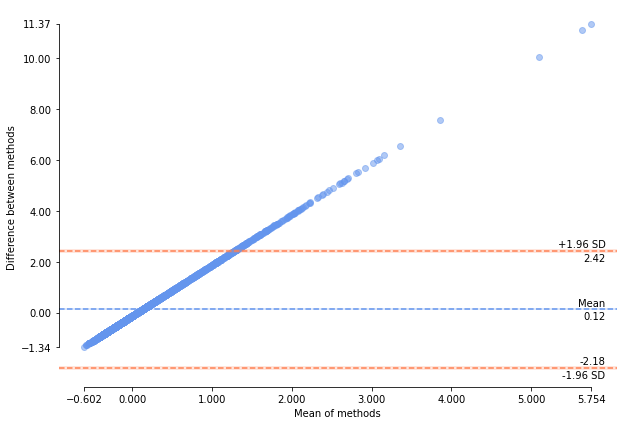

In [115]:
for i,v in enumerate(linear_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  print('score = ', lm.score(X_train,y_train))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

*Respecto a algunos experimentos que realizamos inicialmente, la incorporación del salario del jugador en la tempoarada previa incrementó notablemente la performance de los modelos*.

*Al evaluar el gráfico de Bland-Altman notamos que:*

*   *La regresión lineal ajustada para predecir el valor de salario en sus unidades originales, logra la mejor predicción ya que más puntos se encuentran sobre y=0, es decir, que la diferencia entre la predicción y el valor real se acerca al valor nulo. Esto coincide con el menor error absoluto medio (MAE mean absolute error)* 
*   *La regresión lineal ajustada para predecir el valor de salario normalizado a la temporada presenta mayor cantidad de puntos dentro de 1.96 desvíos estándar*


#Regresión incorporando atributos categóricos

####Análisis del Dataset

In [116]:
df_cat = df.copy()
df_cat.columns

Index(['player_id', 'salary', 'season_start', 'team', 'norm_salary',
       'career_AST', 'career_FG%', 'career_FG3%', 'career_FT%', 'career_G',
       'career_PER', 'career_PTS', 'career_TRB', 'career_WS', 'career_eFG%',
       'draft_pick', 'draft_round', 'draft_team', 'draft_year', 'shoots',
       'actual_age', 'season_number', 'country', 'reformedPositions',
       'numPositions', 'height_cm', 'weight_kg', 'IMC', 'prev_salary',
       'prev_norm_salary'],
      dtype='object')

####Eliminación de filas con datos desconocidos

In [117]:
#Filtrar filas que no tengo completas
print('Total inicial de filas ', len(df_cat))
df_cat.dropna(inplace=True)
df_cat.reset_index(inplace=True, drop=True)
print('Total de filas luego de eliminar aquellas que no estaban totalmente completas ', len(df_cat))

Total inicial de filas  14163
Total de filas luego de eliminar aquellas que no estaban totalmente completas  11917


###Codificación de variables categóricas

In [118]:
le = preprocessing.LabelEncoder()

#### Team

In [119]:
le.fit(df_cat['team'])
print(le.classes_)
df_cat['team'] = le.transform(df_cat['team'])

['Atlanta Hawks' 'Boston Celtics' 'Brooklyn Nets' 'Charlotte Bobcats'
 'Charlotte Hornets' 'Chicago Bulls' 'Cleveland Cavaliers'
 'Dallas Mavericks' 'Denver Nuggets' 'Detroit Pistons'
 'Golden State Warriors' 'Houston Rockets' 'Indiana Pacers'
 'Kansas City Kings' 'Los Angeles Clippers' 'Los Angeles Lakers'
 'Memphis Grizzlies' 'Miami Heat' 'Milwaukee Bucks'
 'Minnesota Timberwolves' 'New Jersey Nets' 'New Orleans Hornets'
 'New Orleans Pelicans' 'New Orleans/Oklahoma City Hornets'
 'New York Knicks' 'Oklahoma City Thunder' 'Orlando Magic'
 'Philadelphia 76ers' 'Phoenix Suns' 'Portland Trail Blazers'
 'Sacramento Kings' 'San Antonio Spurs' 'Seattle SuperSonics'
 'Toronto Raptors' 'Utah Jazz' 'Vancouver Grizzlies' 'Washington Bullets'
 'Washington Wizards']


#### Shoots

In [120]:
le.fit(df_cat['shoots'])
print(le.classes_)
df_cat['shoots'] = le.transform(df_cat['shoots'])

['Left' 'Left Right' 'Right']


#### Positions

In [121]:
for i in range(len(df_cat)):
  df_cat['reformedPositions'][i] = str(df_cat['reformedPositions'][i])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [122]:
le.fit(df_cat['reformedPositions'])
print(le.classes_)
df_cat['reformedPositions'] = le.transform(df_cat['reformedPositions'])

["['C', 'PF', 'SF']" "['C', 'PF']" "['C', 'SF']" "['C']"
 "['PF', 'PG', 'SF', 'SG']" "['PF', 'PG', 'SG']" "['PF', 'SF', 'SG']"
 "['PF', 'SF']" "['PF', 'SG']" "['PF']" "['PG', 'SF', 'SG']"
 "['PG', 'SG']" "['PG']" "['SF', 'SG']" "['SF']" "['SG']"]


#### Nationality

In [123]:
le.fit(df_cat['country'])
print(le.classes_)
df_cat['country'] = le.transform(df_cat['country'])

['USA' 'others']


#### Draft Team

In [124]:
le.fit(df_cat['draft_team'])
print(le.classes_)
df_cat['draft_team'] = le.transform(df_cat['draft_team'])

['Atlanta Hawks' 'Boston Celtics' 'Brooklyn Nets' 'Buffalo Braves'
 'Charlotte Bobcats' 'Charlotte Hornets' 'Chicago Bulls'
 'Cleveland Cavaliers' 'Dallas Mavericks' 'Denver Nuggets'
 'Detroit Pistons' 'Golden State Warriors' 'Houston Rockets'
 'Indiana Pacers' 'Kansas City Kings' 'Kansas City-Omaha Kings'
 'Los Angeles Clippers' 'Los Angeles Lakers' 'Memphis Grizzlies'
 'Miami Heat' 'Milwaukee Bucks' 'Minnesota Timberwolves' 'New Jersey Nets'
 'New Orleans Hornets' 'New Orleans Jazz' 'New Orleans Pelicans'
 'New Orleans/Oklahoma City Hornets' 'New York Knicks'
 'Oklahoma City Thunder' 'Orlando Magic' 'Philadelphia 76ers'
 'Phoenix Suns' 'Portland Trail Blazers' 'Sacramento Kings'
 'San Antonio Spurs' 'San Diego Clippers' 'Seattle SuperSonics'
 'Toronto Raptors' 'Utah Jazz' 'Vancouver Grizzlies' 'Washington Bullets'
 'Washington Wizards']


###Codificación de variables numéricas ordinales

In [125]:
oe = preprocessing.OrdinalEncoder()

In [126]:
df_cat.columns

Index(['player_id', 'salary', 'season_start', 'team', 'norm_salary',
       'career_AST', 'career_FG%', 'career_FG3%', 'career_FT%', 'career_G',
       'career_PER', 'career_PTS', 'career_TRB', 'career_WS', 'career_eFG%',
       'draft_pick', 'draft_round', 'draft_team', 'draft_year', 'shoots',
       'actual_age', 'season_number', 'country', 'reformedPositions',
       'numPositions', 'height_cm', 'weight_kg', 'IMC', 'prev_salary',
       'prev_norm_salary'],
      dtype='object')

#### Season start

In [127]:
oe.fit(df_cat['season_start'].values.reshape(-1, 1)) 
df_cat['season_start'] = oe.transform(df_cat['season_start'].values.reshape(-1, 1))

#### Draft pick

In [128]:
oe.fit(df_cat['draft_pick'].values.reshape(-1, 1)) 
df_cat['draft_pick'] = oe.transform(df_cat['draft_pick'].values.reshape(-1, 1))

#### Draft round

In [129]:
oe.fit(df_cat['draft_round'].values.reshape(-1, 1)) 
df_cat['draft_round'] = oe.transform(df_cat['draft_round'].values.reshape(-1, 1))

#### Season number

In [130]:
oe.fit(df_cat['season_number'].values.reshape(-1, 1)) 
df_cat['season_number'] = oe.transform(df_cat['season_number'].values.reshape(-1, 1))

###Normalización

In [131]:
x_list = []

for i,v in enumerate(df_cat.columns):
  if('salary' !=v and 'norm_salary'!=v  and 'player_id' not in v and 'IMC' not in v):
    x_list.append(v)

x_list

['season_start',
 'team',
 'career_AST',
 'career_FG%',
 'career_FG3%',
 'career_FT%',
 'career_G',
 'career_PER',
 'career_PTS',
 'career_TRB',
 'career_WS',
 'career_eFG%',
 'draft_pick',
 'draft_round',
 'draft_team',
 'draft_year',
 'shoots',
 'actual_age',
 'season_number',
 'country',
 'reformedPositions',
 'numPositions',
 'height_cm',
 'weight_kg',
 'prev_salary',
 'prev_norm_salary']

In [132]:
X_original = df_cat[x_list]
y_original = df_cat['salary']
y_original2 = df_cat['norm_salary']
groups = df_cat['player_id']

In [133]:
X,y = pre_norm(X_original, y_original, True) #normalizo
X2,y2 = pre_norm(X_original, y_original2, True) #normalizo
#X,y = pre_norm(X_original, y_original, False) #no normalizo

###Partición Train-Test (*player-wise*)

In [134]:
gss = GroupShuffleSplit(n_splits=1, test_size=0.30, random_state=0)
for train_idx, test_idx in gss.split(X, y, groups=groups):
  print(train_idx,test_idx)


[    0     1     2 ... 11912 11913 11914] [    5     6     7 ... 11904 11915 11916]


In [135]:
print('En entrenamiento hay %d jugadores distintos y un total de %d observaciones' %(len(df_cat.iloc[train_idx]['player_id'].unique()), len(train_idx)))
print('En testeo hay %d jugadores distintos y un total de %d observaciones' %(len(df_cat.iloc[test_idx]['player_id'].unique()), len(test_idx)))

En entrenamiento hay 1222 jugadores distintos y un total de 8326 observaciones
En testeo hay 524 jugadores distintos y un total de 3591 observaciones


###Ajuste de Modelos No Paramétricos

In [136]:
#Probamos distintos modelos en su configuración original para realizar regresión no paramétrica
model_1 = KNeighborsRegressor()
model_2 = RadiusNeighborsRegressor()
model_3 = GaussianProcessRegressor() 
model_4 = DecisionTreeRegressor()
model_5 = ExtraTreeRegressor()
model_6 = RandomForestRegressor()

In [137]:
reg_model_list = [model_1, model_2, model_3, model_4, model_5, model_6]
reg_model_list

[KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform'),
 RadiusNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                          metric_params=None, n_jobs=None, p=2, radius=1.0,
                          weights='uniform'),
 GaussianProcessRegressor(alpha=1e-10, copy_X_train=True, kernel=None,
                          n_restarts_optimizer=0, normalize_y=False,
                          optimizer='fmin_l_bfgs_b', random_state=None),
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter=

####Ajuste con salario en unidades originales

In [138]:
X_train = X[train_idx]
y_train = y[train_idx]
X_test = X[test_idx]
y_test = y[test_idx]

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8326, 26), (8326,), (3591, 26), (3591,))

MODELO -> KNeighborsRegressor
----------------------------
score train =  0.8195594232036262
Test:
score =  0.6402371992614937
MAE =  1730257.7183514342
MSE =  8117574064753.437
RMSE =  2849135.6697695944


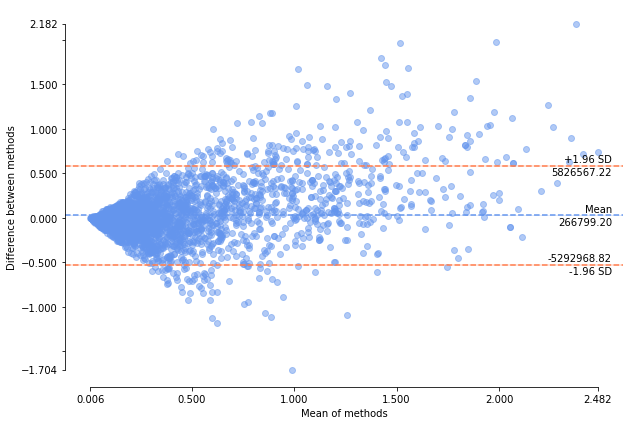



MODELO -> RadiusNeighborsRegressor
----------------------------
score train =  0.45544887875956663
Test:
score =  0.4690517884031736
MAE =  2314048.500884016
MSE =  11980147539818.467
RMSE =  3461234.9732167083


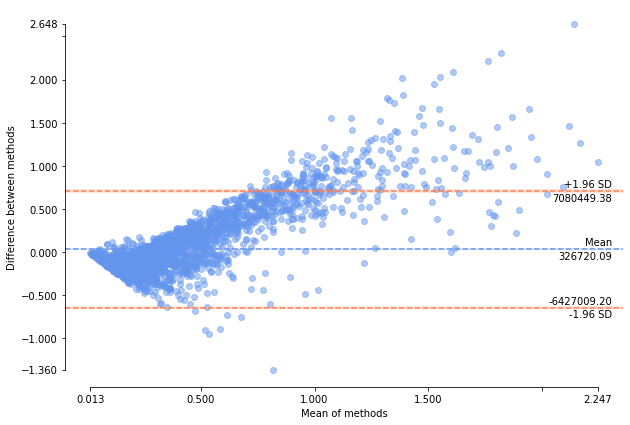



MODELO -> GaussianProcessRegressor
----------------------------
score train =  0.9999984363003174
Test:
score =  -95.16142743176452
MAE =  26561660.003997657
MSE =  2169756038554800.0
RMSE =  46580640.16901013


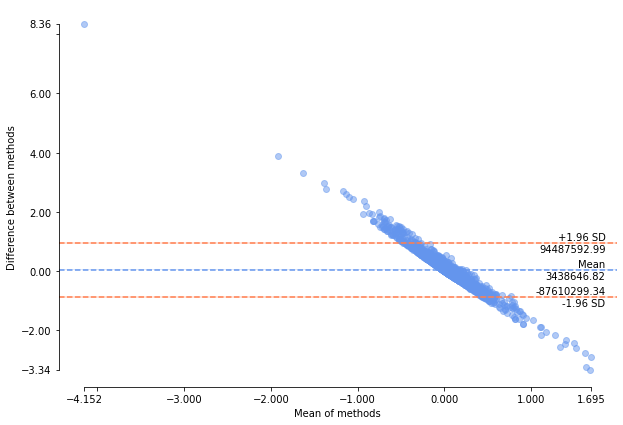



MODELO -> DecisionTreeRegressor
----------------------------
score train =  1.0
Test:
score =  0.5476784368253114
MAE =  1421071.5928710666
MSE =  10206040709651.914
RMSE =  3194689.4543369804


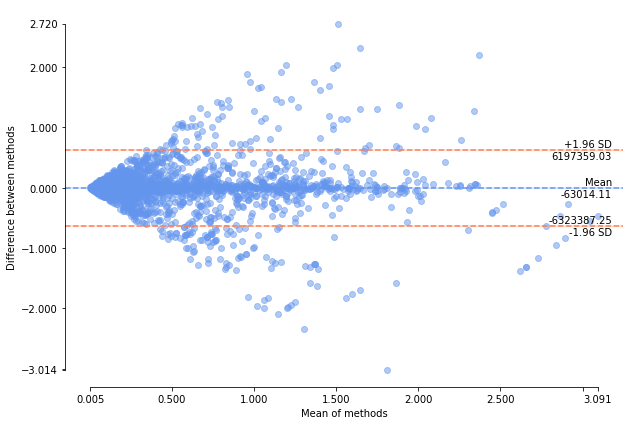



MODELO -> ExtraTreeRegressor
----------------------------
score train =  1.0
Test:
score =  0.5061133492636172
MAE =  1520439.0133667502
MSE =  11143902200882.799
RMSE =  3338248.373156617


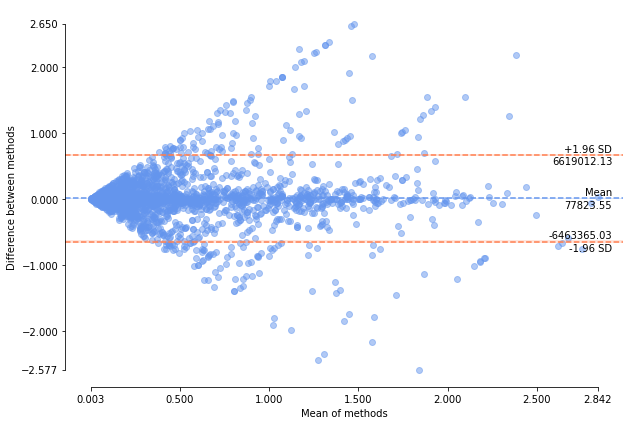



MODELO -> RandomForestRegressor
----------------------------
score train =  0.9702060401773765
Test:
score =  0.7890699116101092
MAE =  1031384.8657142856
MSE =  4759359810061.269
RMSE =  2181595.702705079


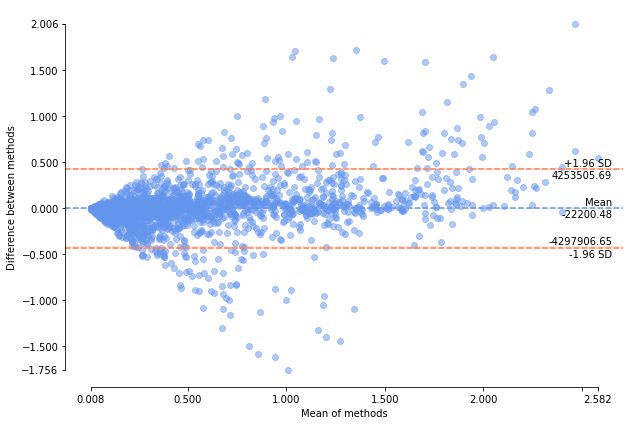

In [139]:
preds = []

for i,v in enumerate(reg_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  preds.append(y_pred)
  print('score train = ', lm.score(X_train,y_train))
  print('Test:')
  print('score = ', lm.score(X_test,y_test))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

####Ajuste con salario normalizado por temporada

In [140]:
X_train = X2[train_idx]
y_train = y2[train_idx]
X_test = X2[test_idx]
y_test = y2[test_idx]

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8326, 26), (8326,), (3591, 26), (3591,))

MODELO -> KNeighborsRegressor
----------------------------
score train =  0.7785024627268977
Test:
score =  0.5227084942713351
MAE =  0.5390025062656641
MSE =  0.6470418678473963
RMSE =  0.8043891271315123


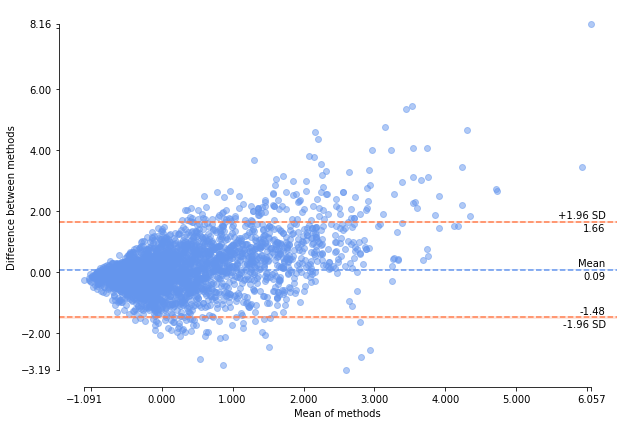



MODELO -> GaussianProcessRegressor
----------------------------
score train =  0.9999925311918881
Test:
score =  -196.0053998490452
MAE =  9.367630318442693
MSE =  267.0710464451784
RMSE =  16.34230847968482


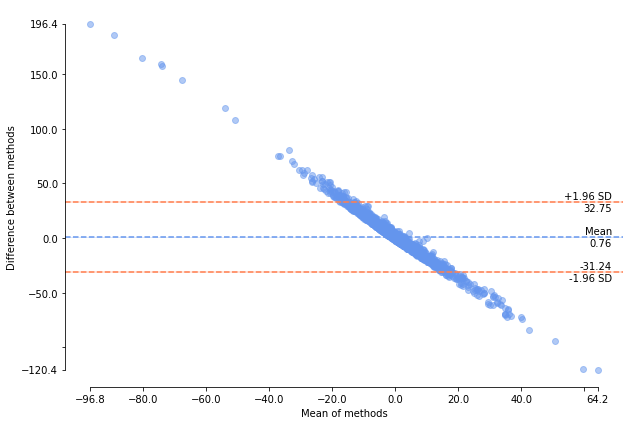



MODELO -> DecisionTreeRegressor
----------------------------
score train =  1.0
Test:
score =  0.46551021479887333
MAE =  0.4706037315510999
MSE =  0.7245829117237538
RMSE =  0.8512243603914034


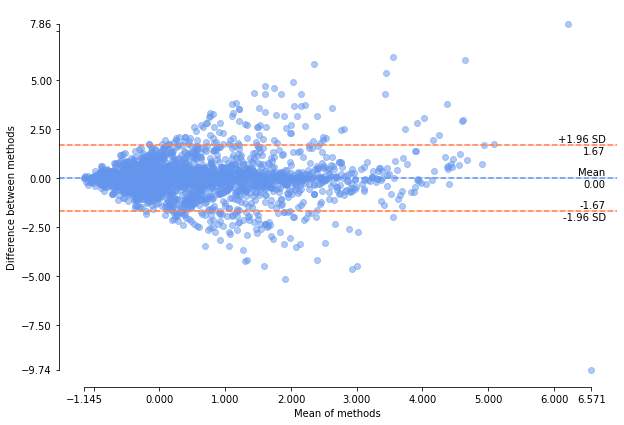



MODELO -> ExtraTreeRegressor
----------------------------
score train =  1.0
Test:
score =  0.39336375760037334
MAE =  0.5076803118908382
MSE =  0.8223885040378724
RMSE =  0.9068563855638182


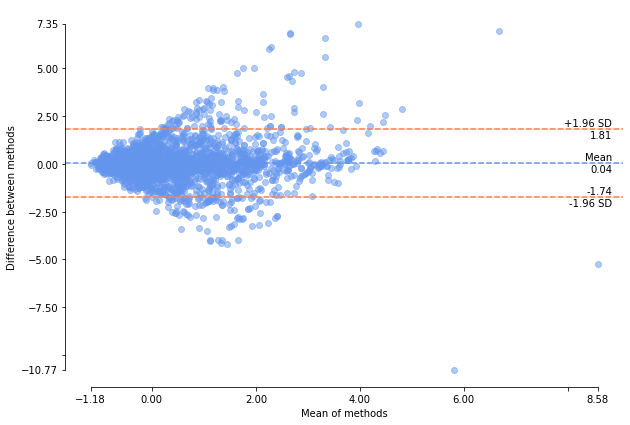



MODELO -> RandomForestRegressor
----------------------------
score train =  0.9587846275044943
Test:
score =  0.730737365839824
MAE =  0.3342476215229432
MSE =  0.365026814132232
RMSE =  0.6041744898059103


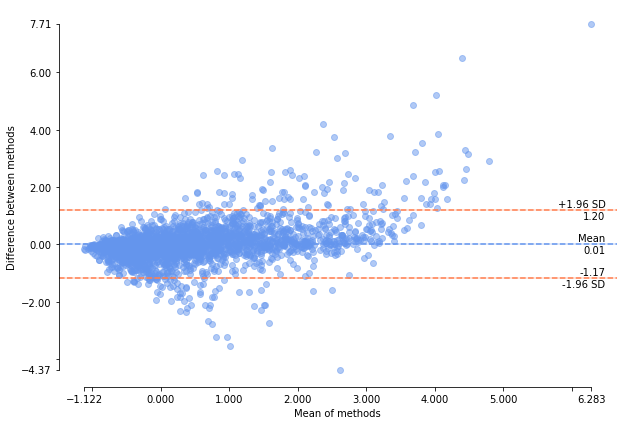

In [141]:
preds = []

for i,v in enumerate(reg_model_list):

  try:
    lm = v.fit(X_train, y_train)
    y_pred = lm.predict(X_test)
    preds.append(y_pred)
    
    print('MODELO ->', type(v).__name__)
    print('----------------------------')
    print('score train = ', lm.score(X_train,y_train))
    print('Test:')
    print('score = ', lm.score(X_test,y_test))
    print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
    print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
    print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
    blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
    print('\n')

  except:
    pass

*Al evaluar el gráfico de Bland-Altman y las métricas obtenidas para cada modelo notamos que*

*   *El  **ExtraTreesRegressor** y el **RandomForestRegressor** logran las mejores predicciones al obtener los menores valores de MAE y disponer más puntos próximos a la línea y=0 en el gráfico de BlandAltman y que representa la diferencia entre los valores predichos y los reales.*  
*   *La incorporación de variables categóricas pareciera mejorar la predicción del salario para los salarios más altos (visualizado en el eje de medias de BlandAltman)*


## Regresión con atributos tras selección de características

###Análisis del Dataset

In [142]:
df_sub = df_cat.copy()
df_sub.columns

Index(['player_id', 'salary', 'season_start', 'team', 'norm_salary',
       'career_AST', 'career_FG%', 'career_FG3%', 'career_FT%', 'career_G',
       'career_PER', 'career_PTS', 'career_TRB', 'career_WS', 'career_eFG%',
       'draft_pick', 'draft_round', 'draft_team', 'draft_year', 'shoots',
       'actual_age', 'season_number', 'country', 'reformedPositions',
       'numPositions', 'height_cm', 'weight_kg', 'IMC', 'prev_salary',
       'prev_norm_salary'],
      dtype='object')

###Eliminación de filas con datos desconocidos

In [143]:
#Filtrar filas que no tengo completas
print('Total inicial de filas ', len(df_sub))
df_sub.dropna(inplace=True)
df_sub.reset_index(inplace=True, drop=True)
print('Total de filas luego de eliminar aquellas que no estaban totalmente completas ', len(df_cat))

Total inicial de filas  11917
Total de filas luego de eliminar aquellas que no estaban totalmente completas  11917


In [144]:
df_sub

,player_id,salary,season_start,team,norm_salary,career_AST,career_FG%,career_FG3%,career_FT%,career_G,career_PER,career_PTS,career_TRB,career_WS,career_eFG%,draft_pick,draft_round,draft_team,draft_year,shoots,actual_age,season_number,country,reformedPositions,numPositions,height_cm,weight_kg,IMC,prev_salary,prev_norm_salary
0,abdelal01,395000,6.0,29,-0.661,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,22,0.0,1,9,1,208.3,108.9,25.1,0,0
1,abdelal01,494000,7.0,29,-0.575,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,23,1.0,1,9,1,208.3,108.9,25.1,395000,-0.661
2,abdelal01,500000,8.0,1,-0.641,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,24,2.0,1,9,1,208.3,108.9,25.1,494000,-0.575
3,abdelal01,805000,9.0,1,-0.475,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,25,3.0,1,9,1,208.3,108.9,25.1,500000,-0.641
4,abdelal01,650000,10.0,30,-0.611,0.3,50.2,0,70.1,256,13,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,26,4.0,1,9,1,208.3,108.9,25.1,805000,-0.475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11912,zidekge01,784200,13.0,8,-0.483,0.2,40.8,25,78.3,135,8.7,3.4,2.1,0.8,40.9,21.0,0.0,5,1995,2,24,2.0,1,3,1,213.4,113.4,24.9,694000,-0.503
11913,zipsepa01,750000,32.0,5,-0.721,0.8,37.1,33.5,76.9,98,6.1,4.7,2.6,0,44.8,47.0,1.0,6,2016,2,22,0.0,1,14,1,203.2,97.5,23.6,0,0
11914,zipsepa01,1312611,33.0,5,-0.649,0.8,37.1,33.5,76.9,98,6.1,4.7,2.6,0,44.8,47.0,1.0,6,2016,2,23,1.0,1,14,1,203.2,97.5,23.6,750000,-0.721
11915,zubaciv01,1034956,32.0,15,-0.676,0.8,54,0,76.1,140,17.6,6.9,4.6,5.3,54,31.0,1.0,17,2016,2,19,0.0,1,3,1,215.9,108.9,23.4,0,0


###Correlación

In [145]:
#Vemos tipos de variables
df_sub.dtypes

player_id             object
salary                 int64
season_start         float64
team                   int64
norm_salary           object
career_AST            object
career_FG%            object
career_FG3%           object
career_FT%            object
career_G              object
career_PER            object
career_PTS            object
career_TRB            object
career_WS             object
career_eFG%           object
draft_pick           float64
draft_round          float64
draft_team             int64
draft_year            object
shoots                 int64
actual_age            object
season_number        float64
country                int64
reformedPositions      int64
numPositions          object
height_cm             object
weight_kg             object
IMC                   object
prev_salary           object
prev_norm_salary      object
dtype: object

In [146]:
#Transformamos a variables numéricas
players_id_col = df_sub['player_id']
#cols = df_sub.columns
#cols.drop('player_id')

cols=[]
for i, v in enumerate (df_sub.columns):
  if ('player_id' not in v):
    cols.append(v)

df_sub = df_sub[cols].apply(pd.to_numeric, errors='coerce') 
df_sub.insert(0, 'player_id', players_id_col)
df_sub

,player_id,salary,season_start,team,norm_salary,career_AST,career_FG%,career_FG3%,career_FT%,career_G,career_PER,career_PTS,career_TRB,career_WS,career_eFG%,draft_pick,draft_round,draft_team,draft_year,shoots,actual_age,season_number,country,reformedPositions,numPositions,height_cm,weight_kg,IMC,prev_salary,prev_norm_salary
0,abdelal01,395000,6.0,29,-0.661,0.3,50.2,0.0,70.1,256.0,13.0,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,22,0.0,1,9,1,208.3,108.9,25.1,0,0.000
1,abdelal01,494000,7.0,29,-0.575,0.3,50.2,0.0,70.1,256.0,13.0,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,23,1.0,1,9,1,208.3,108.9,25.1,395000,-0.661
2,abdelal01,500000,8.0,1,-0.641,0.3,50.2,0.0,70.1,256.0,13.0,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,24,2.0,1,9,1,208.3,108.9,25.1,494000,-0.575
3,abdelal01,805000,9.0,1,-0.475,0.3,50.2,0.0,70.1,256.0,13.0,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,25,3.0,1,9,1,208.3,108.9,25.1,500000,-0.641
4,abdelal01,650000,10.0,30,-0.611,0.3,50.2,0.0,70.1,256.0,13.0,5.7,3.3,4.8,50.2,24.0,0.0,32,1990,2,26,4.0,1,9,1,208.3,108.9,25.1,805000,-0.475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11912,zidekge01,784200,13.0,8,-0.483,0.2,40.8,25.0,78.3,135.0,8.7,3.4,2.1,0.8,40.9,21.0,0.0,5,1995,2,24,2.0,1,3,1,213.4,113.4,24.9,694000,-0.503
11913,zipsepa01,750000,32.0,5,-0.721,0.8,37.1,33.5,76.9,98.0,6.1,4.7,2.6,0.0,44.8,47.0,1.0,6,2016,2,22,0.0,1,14,1,203.2,97.5,23.6,0,0.000
11914,zipsepa01,1312611,33.0,5,-0.649,0.8,37.1,33.5,76.9,98.0,6.1,4.7,2.6,0.0,44.8,47.0,1.0,6,2016,2,23,1.0,1,14,1,203.2,97.5,23.6,750000,-0.721
11915,zubaciv01,1034956,32.0,15,-0.676,0.8,54.0,0.0,76.1,140.0,17.6,6.9,4.6,5.3,54.0,31.0,1.0,17,2016,2,19,0.0,1,3,1,215.9,108.9,23.4,0,0.000


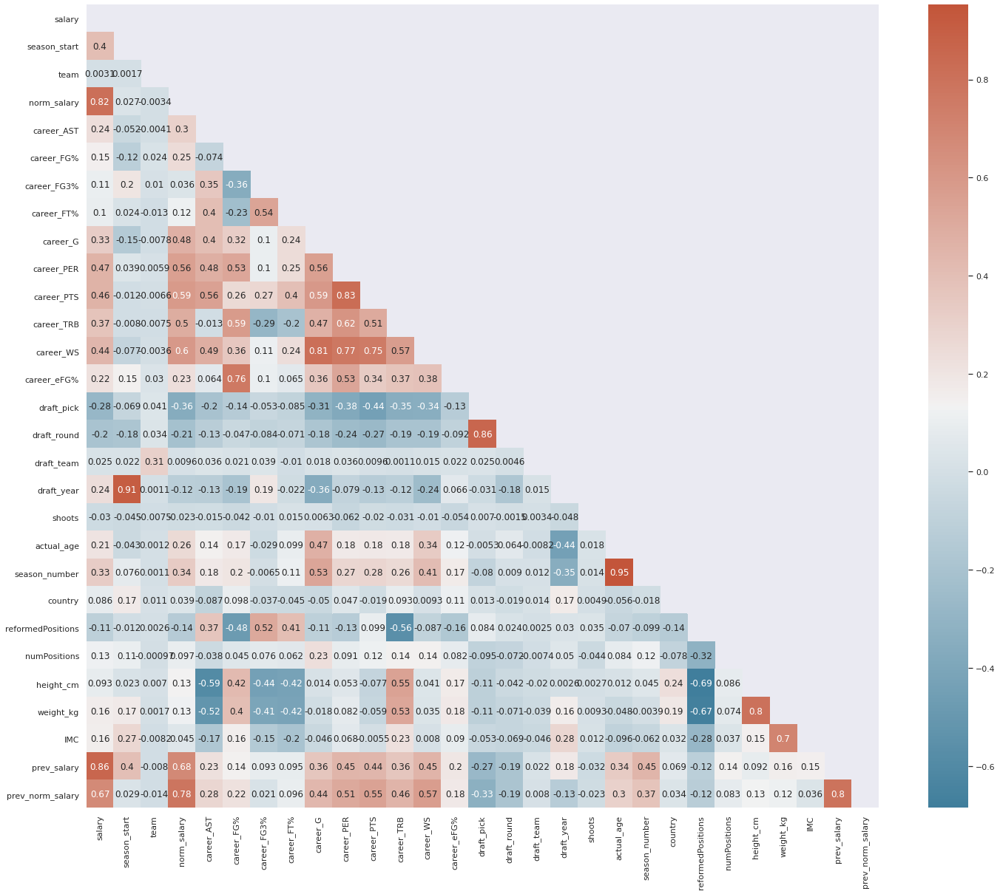

In [147]:
sns.set()

corr = df_sub.corr()
f, ax = plt.subplots(figsize=(24, 20))
mask = np.triu(np.ones_like(corr, dtype=bool))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, annot=True, mask = mask, cmap=cmap)

In [148]:
corr

,salary,season_start,team,norm_salary,career_AST,career_FG%,career_FG3%,career_FT%,career_G,career_PER,career_PTS,career_TRB,career_WS,career_eFG%,draft_pick,draft_round,draft_team,draft_year,shoots,actual_age,season_number,country,reformedPositions,numPositions,height_cm,weight_kg,IMC,prev_salary,prev_norm_salary
salary,1.000000,0.402404,0.003062,0.815246,0.235250,0.148879,0.107507,0.101377,0.329006,0.465244,0.461627,0.373436,0.442376,0.219437,-0.276096,-0.197664,0.024635,0.241273,-0.029625,0.208671,0.326019,0.086472,-0.108943,0.125300,0.093197,0.161679,0.156831,0.858284,0.673607
season_start,0.402404,1.000000,0.001704,0.026915,-0.051875,-0.115113,0.201369,0.024425,-0.146484,0.039055,-0.011851,-0.007997,-0.076555,0.146040,-0.069483,-0.183782,0.021711,0.908005,-0.044575,-0.042611,0.076143,0.174068,-0.011738,0.107656,0.022976,0.172575,0.268782,0.396684,0.028715
team,0.003062,0.001704,1.000000,-0.003361,-0.004138,0.024242,0.010483,-0.012821,-0.007834,0.005932,-0.006620,-0.007459,-0.003567,0.029724,0.041172,0.033703,0.312626,0.001147,-0.007468,0.001213,0.001082,0.010942,0.002628,-0.000966,0.007038,0.001704,-0.008165,-0.008042,-0.013687
norm_salary,0.815246,0.026915,-0.003361,1.000000,0.304059,0.254328,0.035651,0.115572,0.476461,0.559730,0.590223,0.495266,0.600583,0.231177,-0.358652,-0.213687,0.009622,-0.116517,-0.023377,0.259087,0.337518,0.038884,-0.135535,0.097173,0.134959,0.125619,0.045432,0.679636,0.780087
career_AST,0.235250,-0.051875,-0.004138,0.304059,1.000000,-0.074369,0.353335,0.404946,0.404852,0.480077,0.555696,-0.012540,0.486663,0.063775,-0.204930,-0.126748,0.035609,-0.125958,-0.015028,0.141496,0.183722,-0.087293,0.369638,-0.037811,-0.594322,-0.523448,-0.172828,0.225986,0.277173
career_FG%,0.148879,-0.115113,0.024242,0.254328,-0.074369,1.000000,-0.358194,-0.234983,0.321707,0.527524,0.258096,0.587097,0.356323,0.762655,-0.138262,-0.046696,0.020964,-0.193819,-0.042199,0.174216,0.203755,0.098104,-0.475101,0.044729,0.423054,0.404773,0.156728,0.142155,0.221911
career_FG3%,0.107507,0.201369,0.010483,0.035651,0.353335,-0.358194,1.000000,0.542099,0.102978,0.102930,0.270669,-0.285926,0.109010,0.104780,-0.052736,-0.084408,0.038620,0.192009,-0.010006,-0.028584,-0.006480,-0.036833,0.516891,0.075647,-0.438717,-0.410239,-0.149636,0.093170,0.020594
career_FT%,0.101377,0.024425,-0.012821,0.115572,0.404946,-0.234983,0.542099,1.000000,0.243341,0.248582,0.398354,-0.202052,0.238237,0.065358,-0.084780,-0.070549,-0.010394,-0.022434,0.014805,0.098816,0.108034,-0.045492,0.406286,0.061628,-0.423629,-0.423161,-0.195574,0.094623,0.095689
career_G,0.329006,-0.146484,-0.007834,0.476461,0.404852,0.321707,0.102978,0.243341,1.000000,0.560689,0.594662,0.471822,0.814501,0.355183,-0.312443,-0.182279,0.018434,-0.360642,0.006312,0.474191,0.530600,-0.049602,-0.105419,0.234566,0.014341,-0.017636,-0.046279,0.361452,0.436738
career_PER,0.465244,0.039055,0.005932,0.559730,0.480077,0.527524,0.102930,0.248582,0.560689,1.000000,0.830985,0.624749,0.768027,0.531991,-0.378280,-0.244615,0.036264,-0.078657,-0.062285,0.175843,0.274570,0.047103,-0.130222,0.090929,0.052548,0.082169,0.067781,0.448390,0.514990


####Selección para salario en unidades originales

In [149]:
x_list_1 = []

for i,v in enumerate(corr.columns):
  if('salary' !=v and 'norm_salary'!=v and 'prev_norm_salary'!=v and corr['salary'][v]>0.30):
    x_list_1.append(v)

x_list_1

['season_start',
 'career_G',
 'career_PER',
 'career_PTS',
 'career_TRB',
 'career_WS',
 'season_number',
 'prev_salary']

####Selección para salario normalizado por temporada

In [150]:
x_list_2 = []

for i,v in enumerate(corr.columns):
  if('salary' !=v and 'norm_salary'!=v and 'prev_salary'!=v and corr['salary'][v]>0.30):
    x_list_2.append(v)

x_list_2

['season_start',
 'career_G',
 'career_PER',
 'career_PTS',
 'career_TRB',
 'career_WS',
 'season_number',
 'prev_norm_salary']

In [151]:
X_original_1 = df_sub[x_list_1]
y_original_1 = df_sub['salary']

X_original_2 = df_sub[x_list_2]
y_original_2 = df_sub['norm_salary']

groups = df_sub['player_id']

In [152]:
X1,y1 = pre_norm(X_original_1, y_original_1, True) #normalizo
X2,y2 = pre_norm(X_original_2, y_original_2, True) #normalizo
#X,y = pre_norm(X_original, y_original, False) #no normalizo

###Partición Train-Test (*player-wise*)

In [153]:
#hacemos un group shuffle split para que los jugadores nos queden en disitntos subsets
gss = GroupShuffleSplit(n_splits=1, test_size=0.30, random_state=0)
for train_idx, test_idx in gss.split(X1, y1, groups=groups):
  print(train_idx,test_idx)


[    0     1     2 ... 11912 11913 11914] [    5     6     7 ... 11904 11915 11916]


In [154]:
print('En entrenamiento hay %d jugadores distintos y un total de %d observaciones' %(len(df_sub.iloc[train_idx]['player_id'].unique()), len(train_idx)))
print('En testeo hay %d jugadores distintos y un total de %d observaciones' %(len(df_sub.iloc[test_idx]['player_id'].unique()), len(test_idx)))

En entrenamiento hay 1222 jugadores distintos y un total de 8326 observaciones
En testeo hay 524 jugadores distintos y un total de 3591 observaciones


###Ajuste de Modelos

####Ajuste con salario en unidades originales

In [155]:
X_train = X1[train_idx]
y_train = y1[train_idx]
X_test = X1[test_idx]
y_test = y1[test_idx]

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8326, 8), (8326,), (3591, 8), (3591,))

#####Modelos Lineales y No Lineales

In [156]:
linear_model_1 = LinearRegression()
linear_model_2 = Ridge(alpha = 0.5)
linear_model_3 = RidgeCV(alphas=np.logspace(-6, 6, 13)) 
linear_model_4 = Lasso(alpha=0.1)
linear_model_5 = ElasticNet(alpha=0.1)
linear_model_6 = LassoLars(alpha=.1)

In [157]:
linear_model_list = [linear_model_1, linear_model_2, linear_model_3, linear_model_4, linear_model_5, linear_model_6]
linear_model_list

[LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False),
 Ridge(alpha=0.5, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001),
 RidgeCV(alphas=array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01,
        1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06]),
         cv=None, fit_intercept=True, gcv_mode=None, normalize=False,
         scoring=None, store_cv_values=False),
 Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
       normalize=False, positive=False, precompute=False, random_state=None,
       selection='cyclic', tol=0.0001, warm_start=False),
 ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0.5,
            max_iter=1000, normalize=False, positive=False, precompute=False,
            random_state=None, selection='cyclic', tol=0.0001, warm_start=False),
 LassoLars(alpha=0.1, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
           fit_

MODELO -> LinearRegression
----------------------------
score train =  0.7665261497711445
Test:
score =  0.7467071496635214
MAE =  1219409.347327431
MSE =  5715219773856.958
RMSE =  2390652.583261934


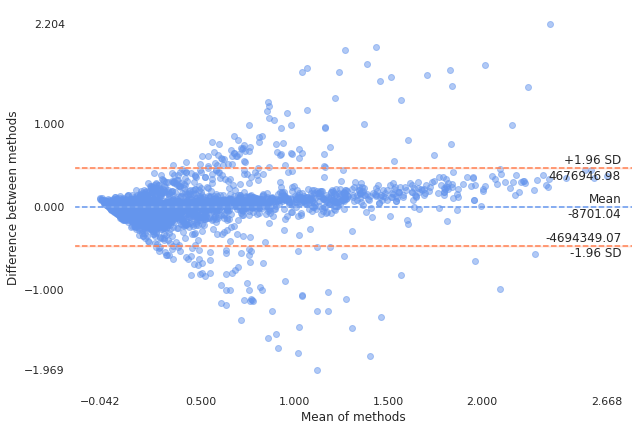



MODELO -> Ridge
----------------------------
score train =  0.7665069248224122
Test:
score =  0.7468316910064698
MAE =  1224593.7549674283
MSE =  5712409662379.526
RMSE =  2390064.7820466137


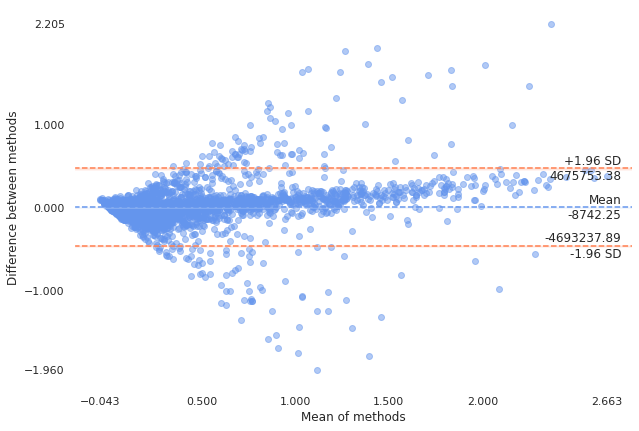



MODELO -> RidgeCV
----------------------------
score train =  0.7665253701877971
Test:
score =  0.7467351156795885
MAE =  1220443.1593237775
MSE =  5714588757514.37
RMSE =  2390520.6038673604


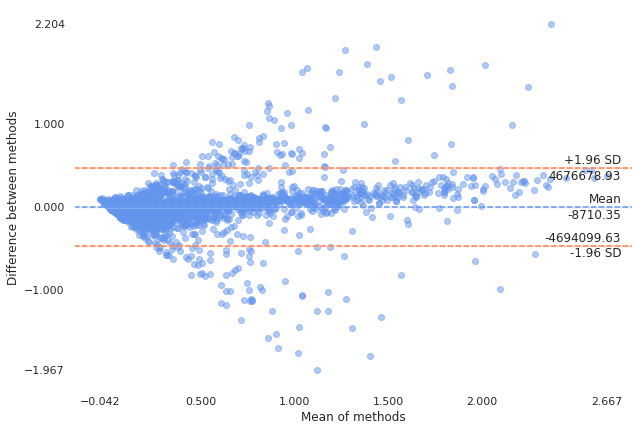



MODELO -> Lasso
----------------------------
score train =  0.7665261497708922
Test:
score =  0.7467071484735197
MAE =  1219409.2829236493
MSE =  5715219800707.781
RMSE =  2390652.5888777277


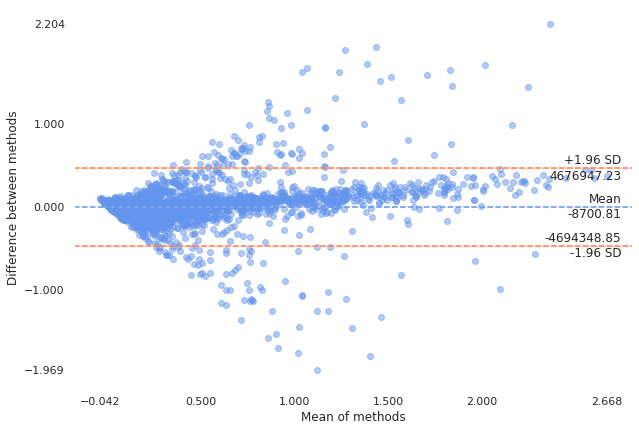



MODELO -> ElasticNet
----------------------------
score train =  0.48777290246328764
Test:
score =  0.4830103214337671
MAE =  2249749.4300427637
MSE =  11665191614751.857
RMSE =  3415434.3230037168


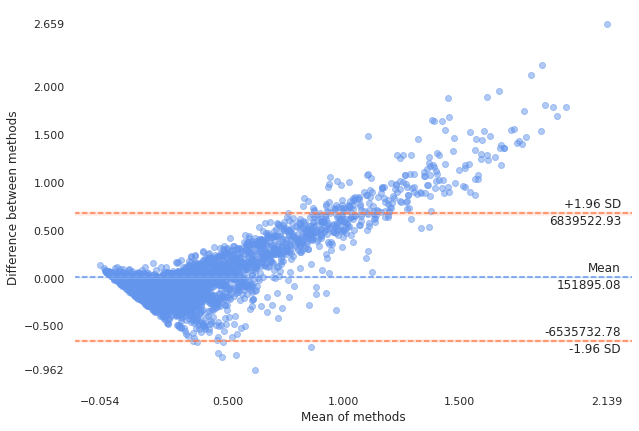



MODELO -> LassoLars
----------------------------
score train =  0.7665261497376883
Test:
score =  0.7467071551026314
MAE =  1219406.0864602684
MSE =  5715219651130.6
RMSE =  2390652.557593972


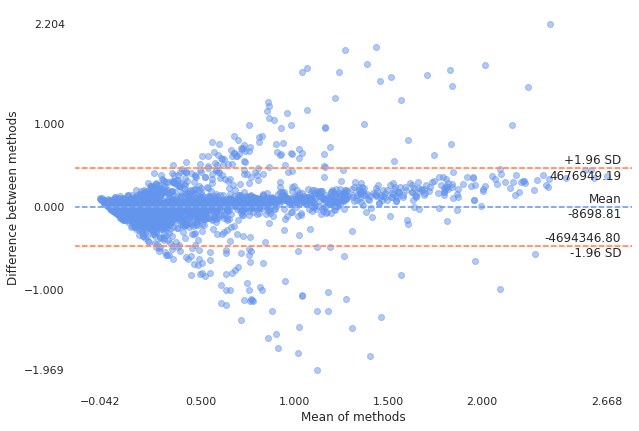

In [158]:
preds = []
for i,v in enumerate(linear_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  preds.append(y_pred)
  print('score train = ', lm.score(X_train,y_train))
  print('Test:')
  print('score = ', lm.score(X_test,y_test))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

#####Modelos No paramétricos

In [159]:
model_1 = KNeighborsRegressor()
model_2 = RadiusNeighborsRegressor()
model_3 = GaussianProcessRegressor() 
model_4 = DecisionTreeRegressor()
model_5 = ExtraTreeRegressor()
model_6 = RandomForestRegressor()

In [160]:
reg_model_list = [model_1, model_2, model_3, model_4, model_5, model_6]
reg_model_list

[KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform'),
 RadiusNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                          metric_params=None, n_jobs=None, p=2, radius=1.0,
                          weights='uniform'),
 GaussianProcessRegressor(alpha=1e-10, copy_X_train=True, kernel=None,
                          n_restarts_optimizer=0, normalize_y=False,
                          optimizer='fmin_l_bfgs_b', random_state=None),
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter=

MODELO -> KNeighborsRegressor
----------------------------
score train =  0.843335759507353
Test:
score =  0.7446450242860576
MAE =  1333835.556279588
MSE =  5761748918749.115
RMSE =  2400364.330419263


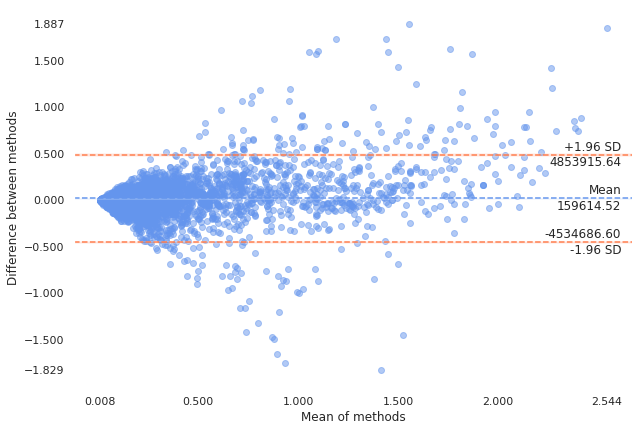



MODELO -> RadiusNeighborsRegressor
----------------------------
score train =  0.16873745405277774
Test:
score =  0.17865235548166736
MAE =  2936864.055515355
MSE =  18532628508566.973
RMSE =  4304953.949645336


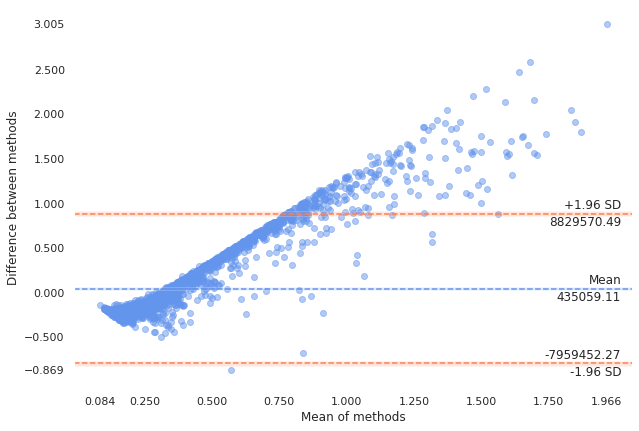



MODELO -> GaussianProcessRegressor
----------------------------
score train =  0.9352713001222109
Test:
score =  -111.56495769546716
MAE =  9897004.833228905
MSE =  2539880107985245.5
RMSE =  50397223.21701113


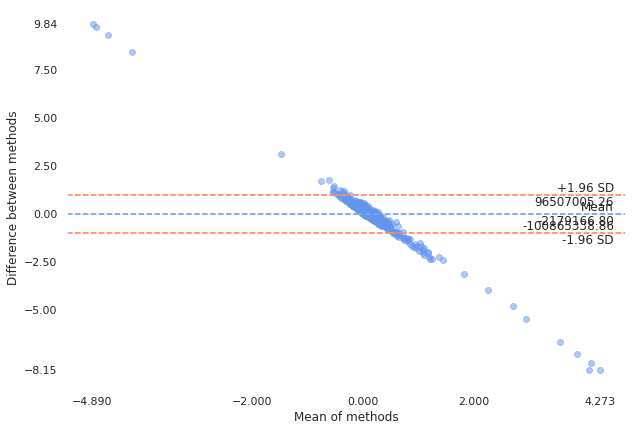



MODELO -> DecisionTreeRegressor
----------------------------
score train =  0.9991543019720592
Test:
score =  0.6099116465838335
MAE =  1364841.1445279866
MSE =  8801830245242.807
RMSE =  2966787.866572669


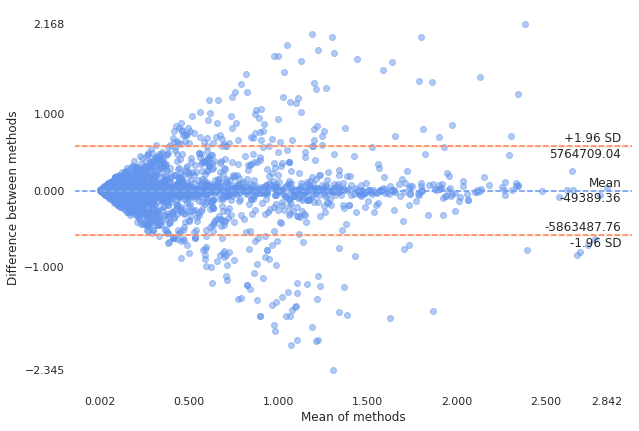



MODELO -> ExtraTreeRegressor
----------------------------
score train =  0.9991543019720592
Test:
score =  0.5117789067192385
MAE =  1567066.0247841827
MSE =  11016066354125.67
RMSE =  3319046.0006040395


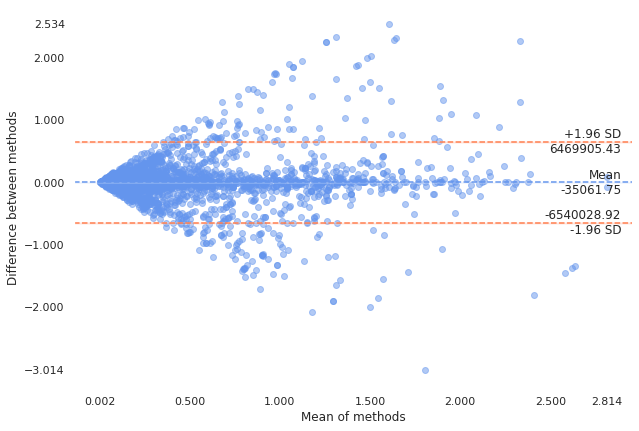



MODELO -> RandomForestRegressor
----------------------------
score train =  0.9701611335601151
Test:
score =  0.7951351974976228
MAE =  1063265.9242246822
MSE =  4622504617376.734
RMSE =  2150001.0738082747


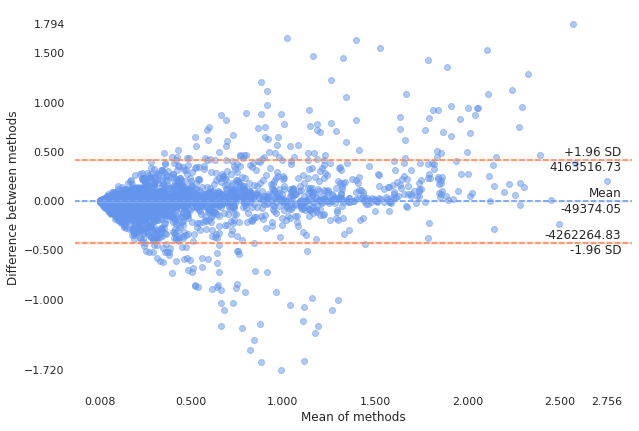

In [161]:
preds = []

for i,v in enumerate(reg_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  preds.append(y_pred)
  print('score train = ', lm.score(X_train,y_train))
  print('Test:')
  print('score = ', lm.score(X_test,y_test))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

####Ajuste con salario normalizado por temporada

In [162]:
X_train = X2[train_idx]
y_train = y2[train_idx]
X_test = X2[test_idx]
y_test = y2[test_idx]


X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8326, 8), (8326,), (3591, 8), (3591,))

#####Modelos Lineales y No Lineales

In [163]:
linear_model_1 = LinearRegression()
linear_model_2 = Ridge(alpha = 0.5)
linear_model_3 = RidgeCV(alphas=np.logspace(-6, 6, 13)) 
linear_model_4 = Lasso(alpha=0.1)
linear_model_5 = ElasticNet(alpha=0.1)
linear_model_6 = LassoLars(alpha=.1)

In [164]:
linear_model_list = [linear_model_1, linear_model_2, linear_model_3, linear_model_4, linear_model_5, linear_model_6]
linear_model_list

[LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False),
 Ridge(alpha=0.5, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='auto', tol=0.001),
 RidgeCV(alphas=array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01,
        1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06]),
         cv=None, fit_intercept=True, gcv_mode=None, normalize=False,
         scoring=None, store_cv_values=False),
 Lasso(alpha=0.1, copy_X=True, fit_intercept=True, max_iter=1000,
       normalize=False, positive=False, precompute=False, random_state=None,
       selection='cyclic', tol=0.0001, warm_start=False),
 ElasticNet(alpha=0.1, copy_X=True, fit_intercept=True, l1_ratio=0.5,
            max_iter=1000, normalize=False, positive=False, precompute=False,
            random_state=None, selection='cyclic', tol=0.0001, warm_start=False),
 LassoLars(alpha=0.1, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
           fit_

MODELO -> LinearRegression
----------------------------
score train =  0.6532876176127286
Test:
score =  0.6628055042804473
MAE =  0.4236586217049239
MSE =  0.45711887540331103
RMSE =  0.6761056688146543


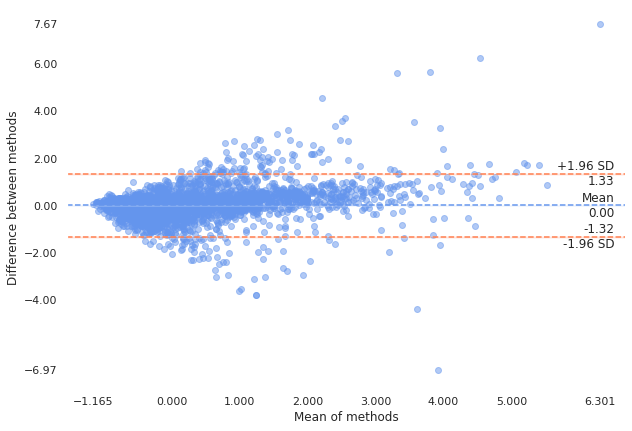



MODELO -> Ridge
----------------------------
score train =  0.6532083583704258
Test:
score =  0.6632444269989788
MAE =  0.4252954350530856
MSE =  0.4565238483135126
RMSE =  0.675665485512996


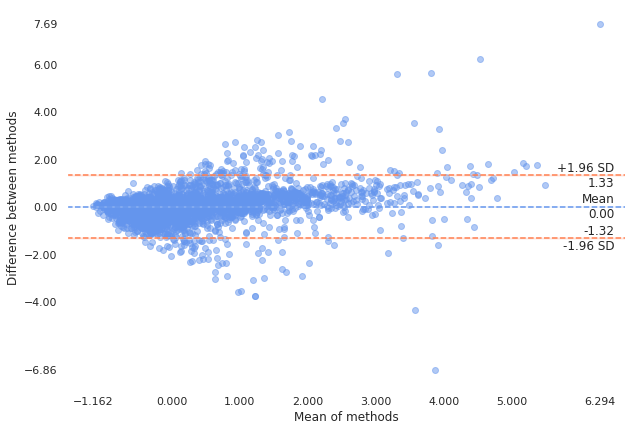



MODELO -> RidgeCV
----------------------------
score train =  0.6532843461128341
Test:
score =  0.6629067505588317
MAE =  0.4239849858679717
MSE =  0.45698162053853314
RMSE =  0.6760041571902743


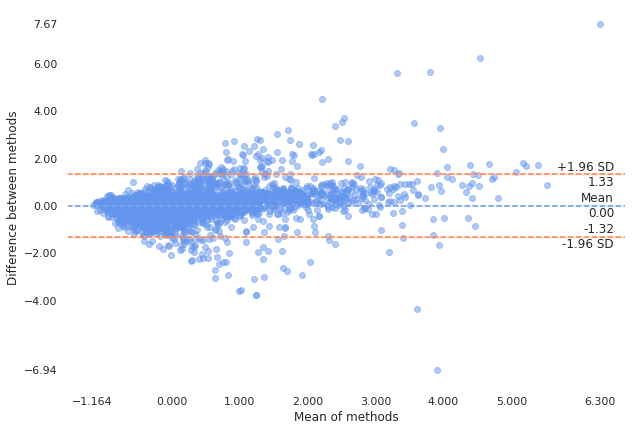



MODELO -> Lasso
----------------------------
score train =  0.0
Test:
score =  -0.021398620784003564
MAE =  0.8437781351181353
MSE =  1.3846625457955328
RMSE =  1.17671685030662


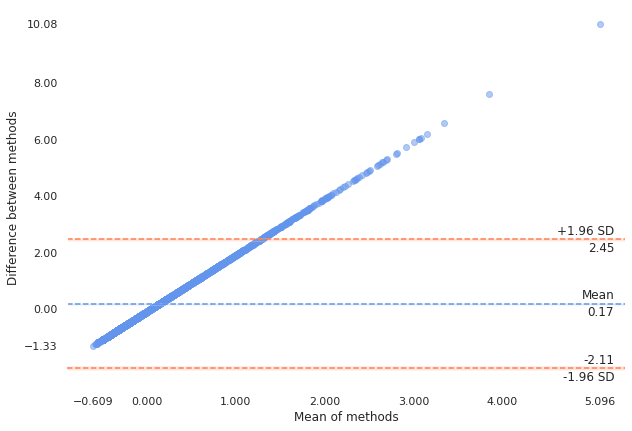



MODELO -> ElasticNet
----------------------------
score train =  0.16369193658449344
Test:
score =  0.1454058539815749
MAE =  0.7668029877403431
MSE =  1.158533487091981
RMSE =  1.0763519345883024


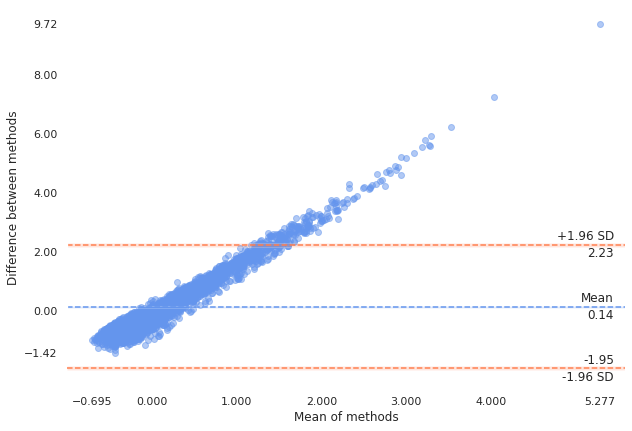



MODELO -> LassoLars
----------------------------
score train =  0.0
Test:
score =  -0.021398620784003564
MAE =  0.8437781351181353
MSE =  1.3846625457955328
RMSE =  1.17671685030662


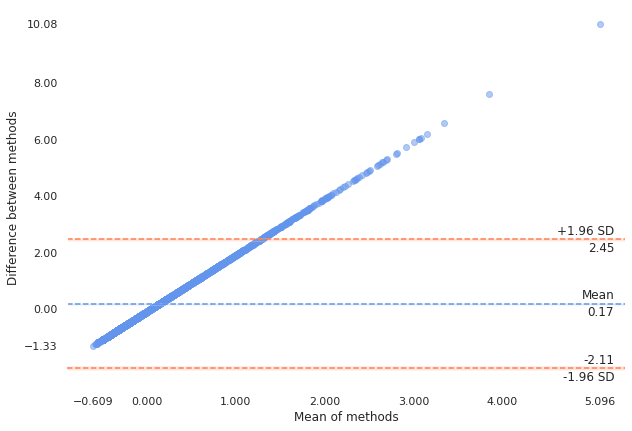

In [165]:
preds = []
for i,v in enumerate(linear_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  preds.append(y_pred)
  print('score train = ', lm.score(X_train,y_train))
  print('Test:')
  print('score = ', lm.score(X_test,y_test))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

#####Modelos No paramétricos

In [166]:
model_1 = KNeighborsRegressor()
model_2 = RadiusNeighborsRegressor()
model_3 = GaussianProcessRegressor() 
model_4 = DecisionTreeRegressor()
model_5 = ExtraTreeRegressor()
model_6 = RandomForestRegressor()

In [167]:
reg_model_list = [model_1, model_2, model_3, model_4, model_5, model_6]
reg_model_list

[KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform'),
 RadiusNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                          metric_params=None, n_jobs=None, p=2, radius=1.0,
                          weights='uniform'),
 GaussianProcessRegressor(alpha=1e-10, copy_X_train=True, kernel=None,
                          n_restarts_optimizer=0, normalize_y=False,
                          optimizer='fmin_l_bfgs_b', random_state=None),
 DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter=

MODELO -> KNeighborsRegressor
----------------------------
score train =  0.7923811783701447
Test:
score =  0.6209003017389969
MAE =  0.4582753550543024
MSE =  0.5139278070509607
RMSE =  0.7168875832729709


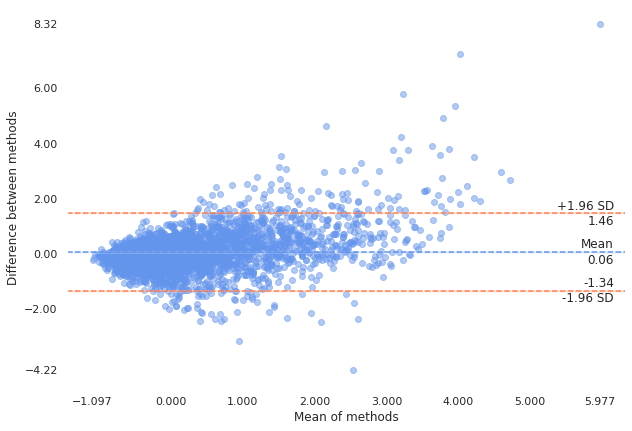



MODELO -> RadiusNeighborsRegressor
----------------------------
score train =  0.12509477076610875
Test:
score =  0.14249865162559072
MAE =  0.7824154074434001
MSE =  1.1624746459436446
RMSE =  1.0781811749161847


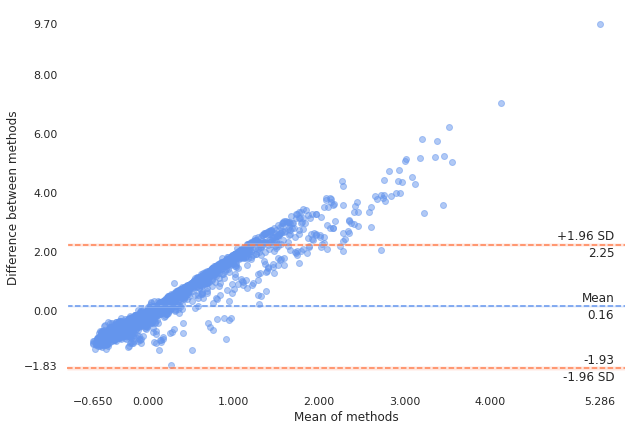



MODELO -> GaussianProcessRegressor
----------------------------
score train =  0.8945562846377499
Test:
score =  -62.45136697950717
MAE =  2.33854460346483
MSE =  86.01806341642846
RMSE =  9.274592358504414


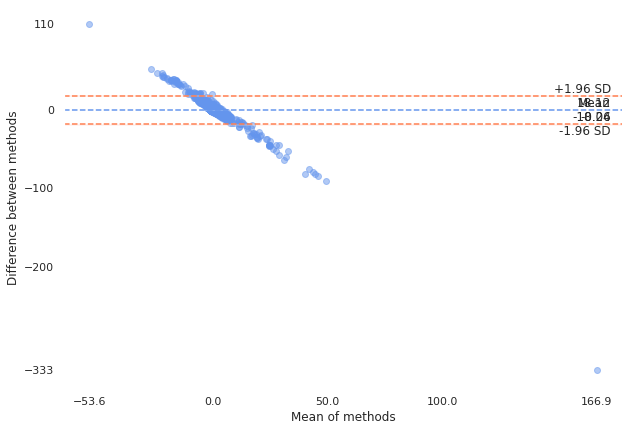



MODELO -> DecisionTreeRegressor
----------------------------
score train =  1.0
Test:
score =  0.5047937288794716
MAE =  0.47949122807017547
MSE =  0.6713280810359231
RMSE =  0.8193461301769376


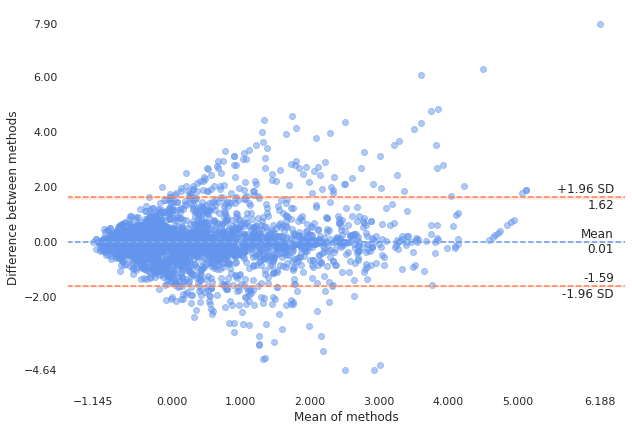



MODELO -> ExtraTreeRegressor
----------------------------
score train =  1.0
Test:
score =  0.3638946647120942
MAE =  0.5184650515176831
MSE =  0.862338380952381
RMSE =  0.9286217642034786


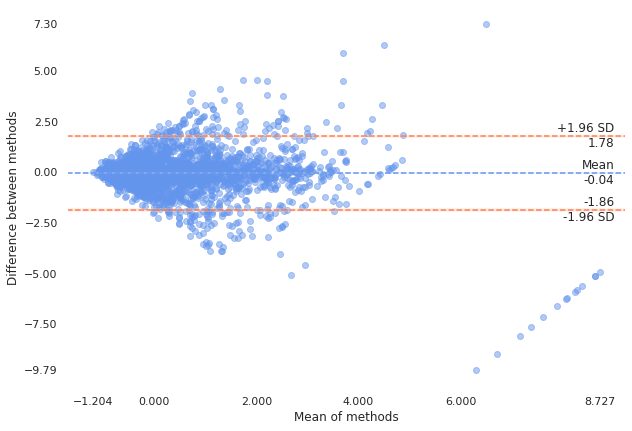



MODELO -> RandomForestRegressor
----------------------------
score train =  0.9570804272954244
Test:
score =  0.7309494322882855
MAE =  0.35216120950524454
MSE =  0.36473932552354454
RMSE =  0.6039365244158897


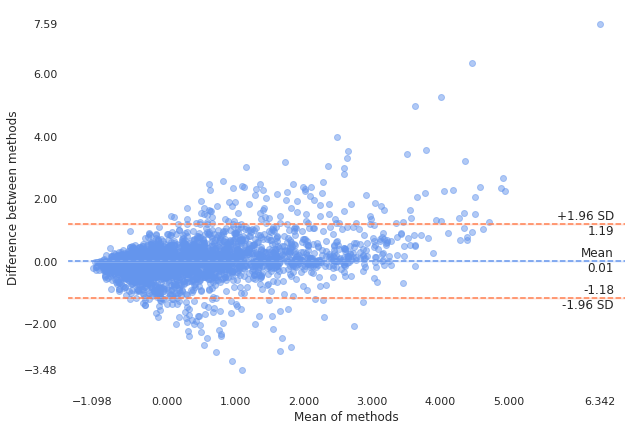

In [168]:
preds = []

for i,v in enumerate(reg_model_list):

  print('MODELO ->', type(v).__name__)
  print('----------------------------')
  lm = v.fit(X_train, y_train)
  y_pred = lm.predict(X_test)
  preds.append(y_pred)
  print('score train = ', lm.score(X_train,y_train))
  print('Test:')
  print('score = ', lm.score(X_test,y_test))
  print("MAE = ", metrics.mean_absolute_error(y_test, y_pred))
  print("MSE = ",metrics.mean_squared_error(y_test, y_pred))
  print("RMSE = ",np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
  blandAltman(y_test, y_pred,limitOfAgreement=1.96,confidenceInterval=95,confidenceIntervalMethod='approximate',detrend=None,percentage=False)
  print('\n')

*En la selección de las características más correlacionadas con los atributos salario o salario normalizado, respectivamente, se obtiene los mismos resultados; es decir, se seleccionan las mismas caracteríticas.*

*Los resultados observados son similares a los obtenidos en experimentos previos empleando únicamente las variables numéricas o incorporando las categóricas, motivo por el cual, se justifica la disminución en el números de atributos.*

*Al observar los gráficos de Bland-Altman en los cuáles hemos representado la diferencia entre los valores reales de salario y los predichos por los distintos modelos, elegimos quedarnos con aquellas opciones en los cuales se observa más concentración de puntos hacia la línea horizontal correspondiente a un valor nulo de diferencia entre estos valores, por ejemplo:* **LinearRegression** *y* **RandomForestRegressor** 

*Sin embargo, nuestros experimentos muestran que las diferencias entre los valores reales y valores predichos son aún demasiado grandes, sobretodo cuándo se trata de predecir valores altos de salario.*

### Optimización del Random Forest Regressor

Haremos una búsqueda randomizada de hiperparámetros primero, para acercarnos a un valor óptimo de cada hiperparámetro, y luego una búsqueda por grilla alrededor de los mejores valores obtenidos. 

In [181]:
#Con salarios originales 
X_train = X1[train_idx]
y_train = y1[train_idx]
X_test = X1[test_idx]
y_test = y1[test_idx]

X_train.shape, y_train.shape, X_test.shape, y_test.shape

((8326, 8), (8326,), (3591, 8), (3591,))

#### Búsqueda randomizada de hiperparámetros

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# Cantidad de árboles del random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Cantidad de atributos a considerar en cada split
max_features = ['auto', 'sqrt']
# Maxima cantidad de niveles en un árbol
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Mínima cantidad de muestras necesarias para que un nodo sea dividido
min_samples_split = [2, 5, 10]
# Mínima cantidad de muestras necesarias en cada nodo
min_samples_leaf = [1, 2, 4]
# Método de selección de árboles
bootstrap = [True, False]
# Crear la grilla aleatoria
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
# Creamos el modelo base
rf = RandomForestRegressor()
# Búsqueda randomizada de hiperparámetros con cross-validation de 3 folds para 100 combinaciones distintas
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,
                               n_iter = 100, cv = 3, verbose=2, 
                               random_state=42, n_jobs = -1)

rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  9.2min
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed: 41.4min
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 76.9min finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestRegressor(bootstrap=True,
                                                   ccp_alpha=0.0,
                                                   criterion='mse',
                                                   max_depth=None,
                                                   max_features='auto',
                                                   max_leaf_nodes=None,
                                                   max_samples=None,
                                                   min_impurity_decrease=0.0,
                                                   min_impurity_split=None,
                                                   min_samples_leaf=1,
                                                   min_samples_split=2,
                                                   min_weight_fraction_leaf=0.0,
                                                   n_estimators=100,
                              

In [ ]:
rf_random.best_params_

{'bootstrap': True,
 'max_depth': 40,
 'max_features': 'auto',
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 600}

In [170]:

base_model = RandomForestRegressor()
base_model.fit(X_train, y_train)
base_score = base_model.score(X_test, y_test)
print('Score = {:0.3f}.'.format(base_score))

Score = 0.798.


In [171]:
base_model

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
best_random = rf_random.best_estimator_
random_score = best_random.score(X_test, y_test)
print('Score = {:0.3f}.'.format(random_score))

Score = 0.797.


In [ ]:
print('Aumento de {:0.3f}%.'.format( 100 * (random_score - base_score) / base_score))

Aumento de 0.257%.


#### Búsqueda por grilla de hiperparámetros

In [172]:
from sklearn.model_selection import GridSearchCV
# Crear grilla según los hiperparámetros óptimos de la búsqueda randomizada
param_grid = {
    'max_depth': [35, 40, 45],
    'min_samples_leaf': [3, 4, 6],
    'min_samples_split': [2],
    'n_estimators': [500,600,700]
}
# Crear el modelo
rf = RandomForestRegressor()
# Instantciar el modelo de grid search
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [173]:
grid_search.fit(X_train,y_train)
grid_search.best_params_

Fitting 3 folds for each of 27 candidates, totalling 81 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  6.1min
[Parallel(n_jobs=-1)]: Done  81 out of  81 | elapsed: 13.1min finished


{'max_depth': 35,
 'min_samples_leaf': 4,
 'min_samples_split': 2,
 'n_estimators': 500}

In [174]:
best_grid = grid_search.best_estimator_
grid_score = best_grid.score(X_test,y_test)

In [175]:
print('Score = {:0.2f}.'.format(grid_score))

Score = 0.80.


In [176]:
print('Aumento de {:0.2f}%.'.format( 100 * (grid_score - base_score) / base_score))

Aumento de -0.03%.


#### Evaluación final de resultados

Text(0.5, 1.0, 'Distancia entre valores reales y predecidos a medida que aumentan los salarios')

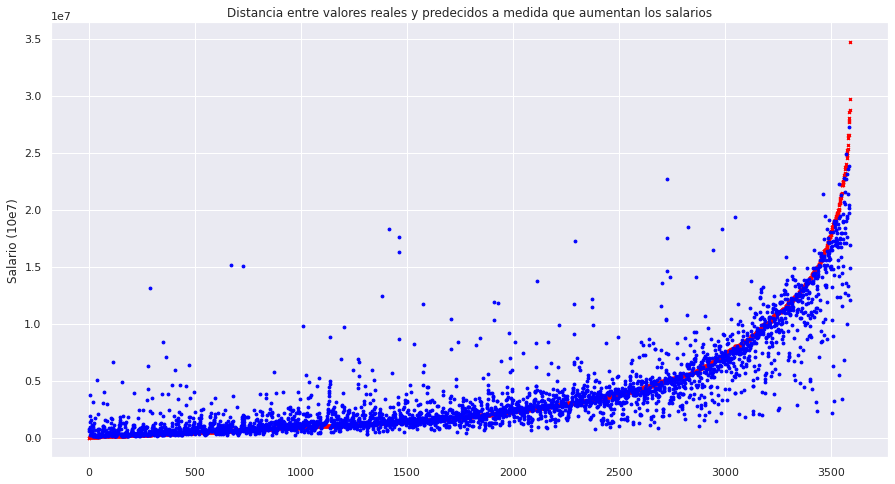

In [182]:
fig,ax = plt.subplots(1,1,figsize=(15,8))
preds = best_grid.predict(X_test)
preds = [x for _, x in sorted(zip(y_test, preds))] 
y_test = sorted(y_test)
plt.scatter(range(len(y_test)),y_test,color='red',s=8,marker='x',label='Valor verdadero')
plt.scatter(range(len(y_test)),preds,color = 'blue',s=8,marker='o',label='Valor predicción')
ax.set_ylabel('Salario (10e7)')
ax.set_xlabel('')
ax.set_title('Distancia entre valores reales y predecidos a medida que aumentan los salarios')

In [183]:
print("MAE = ", metrics.mean_absolute_error(y_test, preds))
print("MSE = ",metrics.mean_squared_error(y_test, preds))

MAE =  1032918.4767464987
MSE =  4568042789932.133


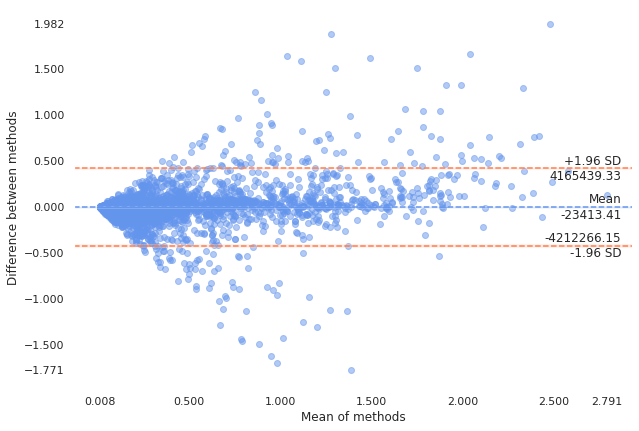

In [184]:
blandAltman(y_test, preds,limitOfAgreement=1.96,
            confidenceInterval=95,confidenceIntervalMethod='approximate',
            detrend=None,percentage=False)


### Conclusión

*Creemos que no se alcanzó un desempeño concluyente. Algunas propuestas de mejora incluyen:*

*   *Eliminar los outliers del dataset (sueldos muy bajos y muy altos)*
*   *Generar un modelo por temporada*
*   *Emplear otros métodos de selección de características y de reducción de dimensionalidad*
*   *Realizar GridSearchCV para encontrar los mejores hiperparámetros para cada modelo sobre este conjunto de datos*


*También exploramos distintas soluciones en la web a datasets similares a este (con temporadas más cortas e incorporarción de otras estadísticas) y en ningún caso se reportaban resultados muy satisfactorios*

